In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
fifa=pd.read_csv('C:/Users/cengi/OneDrive/Masaüstü/dataScientistProject/fifa21_male2.csv')
fifa.head()


C:\Users\cengi\AppData\Local\Temp\ipykernel_1748\3693319911.py:1: DtypeWarning: Columns (78) have mixed types. Specify dtype option on import or set low_memory=False.
  fifa=pd.read_csv('C:/Users/cengi/OneDrive/Masaüstü/dataScientistProject/fifa21_male2.csv')


,ID,Name,Age,OVA,Nationality,Club,BOV,BP,Position,Player Photo,...,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,GK,Gender
0,2,G. Pasquale,33,69,Italy,Udinese,71,LWB,LM,https://cdn.sofifa.com/players/000/002/16_120.png,...,70+-1,70+-1,71+-2,70+-1,69+0,69+0,69+0,70+-1,17+0,Male
1,16,Luis García,37,71,Spain,KAS Eupen,70,CM,CM CAM CDM,https://cdn.sofifa.com/players/000/016/19_120.png,...,66+1,66+1,62+1,60+1,60+1,60+1,60+1,60+1,17+1,Male
2,27,J. Cole,33,71,England,Coventry City,71,CAM,CAM RM RW LM,https://cdn.sofifa.com/players/000/027/16_120.png,...,54+0,54+0,52+0,47+0,46+0,46+0,46+0,47+0,15+0,Male
3,36,D. Yorke,36,68,Trinidad &amp; Tobago,Sunderland,70,ST,NaN,https://cdn.sofifa.com/players/000/036/09_120.png,...,65+0,65+0,56+0,57+0,51+0,51+0,51+0,57+0,22+0,Male
4,41,Iniesta,36,81,Spain,Vissel Kobe,82,CAM,CM CAM,https://cdn.sofifa.com/players/000/041/20_120.png,...,73+3,73+3,70+3,67+3,64+3,64+3,64+3,67+3,17+3,Male



Attacking: Saldırı yetenekleri toplamı
Crossing: Orta yapma yeteneği
Finishing: Bitiricilik
Heading Accuracy: Kafa vuruşu isabeti
Short Passing: Kısa pas yeteneği
Volleys: Vole yeteneği
Skill: Beceri yetenekleri toplamı
Dribbling: Top sürme yeteneği
Curve: Falso verme yeteneği
FK Accuracy: Serbest vuruş isabeti
Long Passing: Uzun pas yeteneği
Ball Control: Top kontrolü
Movement: Hareketlilik toplamı
Acceleration: Hızlanma
Sprint Speed: Sprint hızı
Agility: Çeviklik
Reactions: Tepki süresi
Balance: Denge
Power: Güç yetenekleri toplamı
Shot Power: Şut gücü
Jumping: Zıplama
Stamina: Dayanıklılık
Strength: Fiziksel güç
Long Shots: Uzaktan şut yeteneği
Mentality: Zihinsel yetenekler toplamı
Aggression: Agresiflik
Interceptions: Top kapma
Positioning: Pozisyon alma
Vision: Oyun görüşü
Penalties: Penaltı kullanma
Composure: Soğukkanlılık
Defending: Savunma yetenekleri toplamı
Marking: Adam markajı
Standing Tackle: Ayakta müdahale
Sliding Tackle: Kayarak müdahale

Total Stats: Tüm istatistiklerin toplamı
Base Stats: Temel istatistiklerin toplamı

Goalkeeping: Kalecilik yetenekleri toplamı
GK Diving: Kaleci dalışı
GK Handling: Kaleci top kontrolü
GK Kicking: Kaleci degajı
GK Positioning: Kaleci pozisyon alma
GK Reflexes: Kaleci refleksleri

PAC: Hız (Pace)
SHO: Şut (Shooting)
PAS: Pas (Passing)
DRI: Dribling (Dribbling)
DEF: Defans (Defending)
PHY: Fizik (Physical)

OVA: Genel yetenek puanı (Overall)
BOV: Başlangıç genel puanı (Base Overall)
BP: Ana pozisyonu (Best Position)
Position: Oynayabildiği pozisyon(lar)
POT: Potansiyel puanı (Potential)

Height: Boyu (ör. 180cm)
Weight: Kilosu (ör. 75kg)
foot: Tercih edilen ayak (Right/Left)

Team & Contract: Takım ve sözleşme bilgisi
Value: Piyasa değeri (ör. €50M)
Release Clause: Serbest kalma bedeli


In [39]:
fifa.dtypes

ID              int64
Name           object
Age             int64
OVA             int64
Nationality    object
                ...  
CB             object
RCB            object
RB             object
GK             object
Gender         object
Length: 107, dtype: object

In [40]:
fifa.isnull().sum()

ID             0
Name           0
Age            0
OVA            0
Nationality    0
              ..
CB             0
RCB            0
RB             0
GK             0
Gender         0
Length: 107, dtype: int64

Club                 23
Position            413
Club Logo            23
Joined               58
Loan Date End     16215
Volleys              58
Curve                58
Agility              58
Balance              58
Jumping              58
Interceptions         7
Positioning           7
Vision               58
Composure           423
Sliding Tackle       58
A/W                  89
D/W                  89
dtype: int64


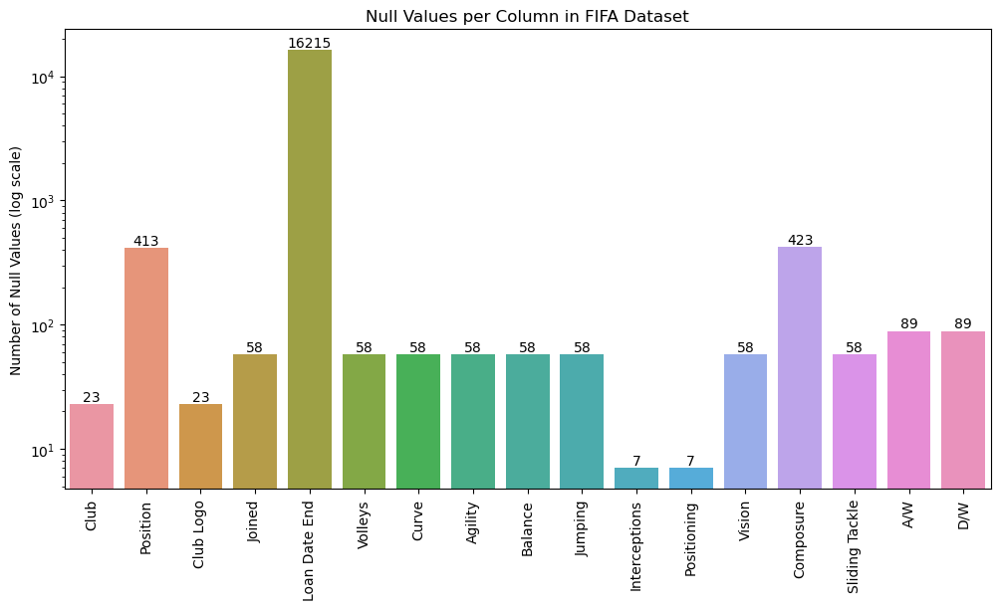

In [4]:
null_counts = fifa.isnull().sum()
null_counts = null_counts[null_counts > 0]
print(null_counts)
null_counts = null_counts[null_counts > 0]
plt.figure(figsize=(12,6))
ax = sns.barplot(x=null_counts.index, y=null_counts.values)
for i, v in enumerate(null_counts.values):
    ax.text(i, v, str(v), color='black', ha='center', va='bottom', fontsize=10, rotation=360)
plt.yscale('log')  # Set y-axis to log scale
plt.xticks(rotation=90)
plt.ylabel('Number of Null Values (log scale)')
plt.title('Null Values per Column in FIFA Dataset')
plt.show()


In [5]:
# Fill numeric columns with median
num_cols = fifa.select_dtypes(include=[np.number]).columns
fifa[num_cols] = fifa[num_cols].fillna(fifa[num_cols].median())

# Fill object columns with mode
obj_cols = fifa.select_dtypes(include=['object']).columns
for col in obj_cols:
    if fifa[col].isnull().any():
        fifa[col] = fifa[col].fillna(fifa[col].mode()[0])

# Check if all nulls are filled
fifa.isnull().sum().sum()

0

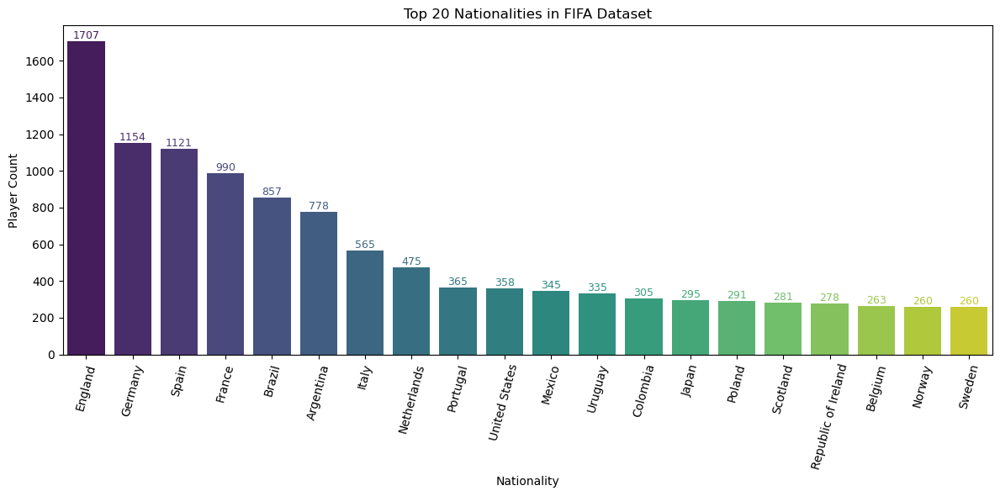

In [7]:
nationality_counts = fifa['Nationality'].value_counts().head(20)
plt.figure(figsize=(12,6))
bars = sns.barplot(x=nationality_counts.index, y=nationality_counts.values, palette='viridis')
plt.xticks(rotation=75)
plt.ylabel('Player Count')
plt.xlabel('Nationality')
plt.title('Top 20 Nationalities in FIFA Dataset')
plt.tight_layout()

for bar in bars.patches:
    bars.annotate(f'{int(bar.get_height())}', 
                  (bar.get_x() + bar.get_width() / 2, bar.get_height()), 
                  ha='center', va='bottom', fontsize=9, color=bar.get_facecolor())

plt.show()


2. Step: Which are the youngest teams?
Question: Which teams have the lowest average age?

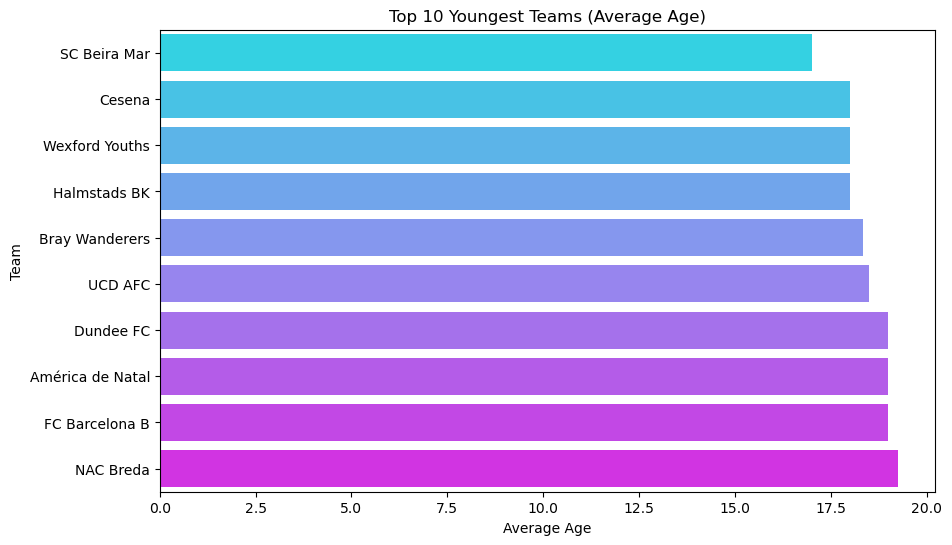

In [45]:
# Calculate average age per club
team_age = fifa.groupby('Club')['Age'].mean().sort_values().head(10)

# Visualization
plt.figure(figsize=(10,6))
sns.barplot(x=team_age.values, y=team_age.index, palette="cool")
plt.title("Top 10 Youngest Teams (Average Age)")
plt.xlabel("Average Age")
plt.ylabel("Team")
plt.show()

3. Step: Who are the most valuable players?
Question: Who are the most valuable players in the game?



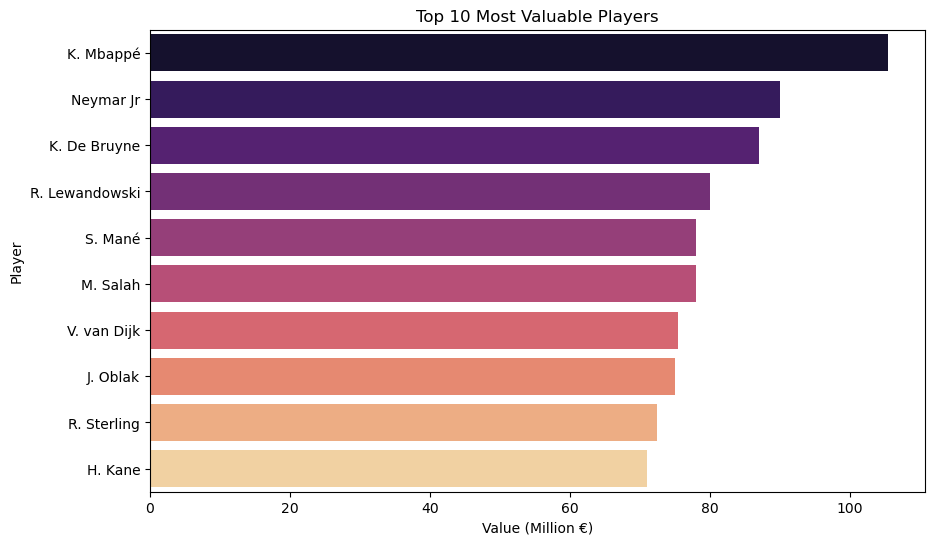

In [47]:
# Convert Value column to numeric
def value_to_float(x):
    if isinstance(x, str):
        if 'M' in x:
            return float(x.replace('€','').replace('M','')) * 1e6
        if 'K' in x:
            return float(x.replace('€','').replace('K','')) * 1e3
    return 0

fifa['ValueNum'] = fifa['Value'].apply(value_to_float)
top_players = fifa.sort_values('ValueNum', ascending=False).head(10)

# Visualization
plt.figure(figsize=(10,6))
sns.barplot(x=top_players['ValueNum']/1e6, y=top_players['Name'], palette="magma")
plt.title("Top 10 Most Valuable Players")
plt.xlabel("Value (Million €)")
plt.ylabel("Player")
plt.show()

4. Step: Which teams have the highest average overall rating (OVA)?
Question: Which teams have the highest average overall rating (OVA)?

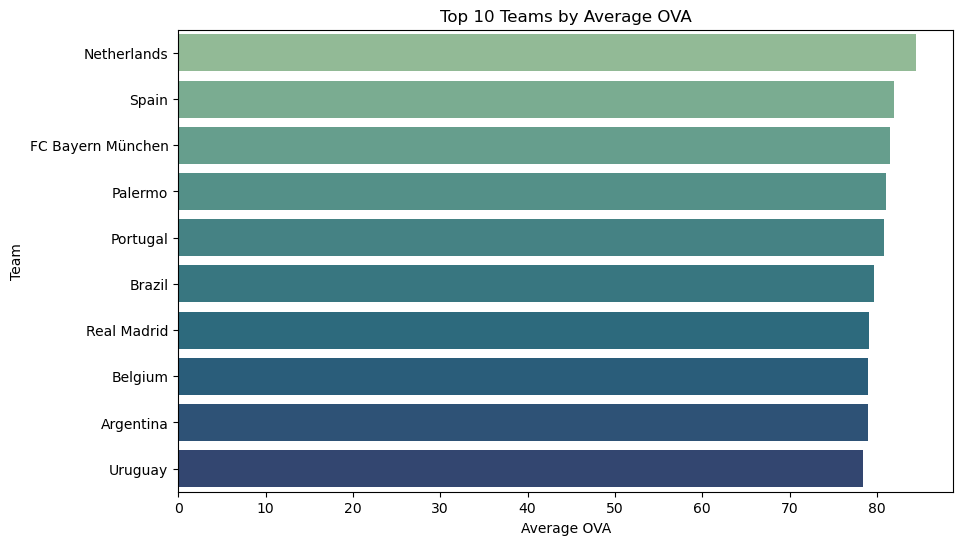

In [49]:
# Calculate average OVA per club
club_ova = fifa.groupby('Club')['OVA'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(10,6))
sns.barplot(x=club_ova.values, y=club_ova.index, palette="crest")
plt.title("Top 10 Teams by Average OVA")
plt.xlabel("Average OVA")
plt.ylabel("Team")
plt.show()

5. Step: Who are the best players by position?
Question: Who are the highest-rated players in each main position?

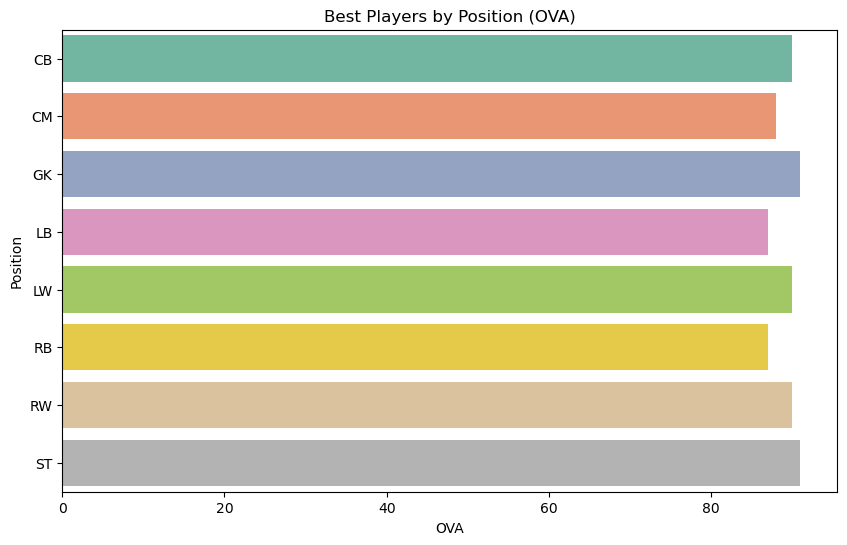

  Position                 Name               Club  OVA
0       CB          V. van Dijk          Liverpool   90
1       CM             T. Kroos        Real Madrid   88
2       GK             J. Oblak    Atlético Madrid   91
3       LB         A. Robertson          Liverpool   87
4       LW              S. Mané          Liverpool   90
5       RB  T. Alexander-Arnold          Liverpool   87
6       RW             M. Salah          Liverpool   90
7       ST       R. Lewandowski  FC Bayern München   91


In [51]:
positions = ['ST', 'GK', 'CB', 'CM', 'LW', 'RW', 'LB', 'RB']
best_by_position = fifa[fifa['Position'].isin(positions)].sort_values('OVA', ascending=False).groupby('Position').first().reset_index()

plt.figure(figsize=(10,6))
sns.barplot(x='OVA', y='Position', data=best_by_position, palette="Set2")
plt.title("Best Players by Position (OVA)")
plt.xlabel("OVA")
plt.ylabel("Position")
plt.show()
print(best_by_position[['Position', 'Name', 'Club', 'OVA']])

6. Step: What is the distribution of player overall ratings (OVA)?
Question: How are player overall ratings distributed in the dataset?

c:\Users\cengi\anaconda\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


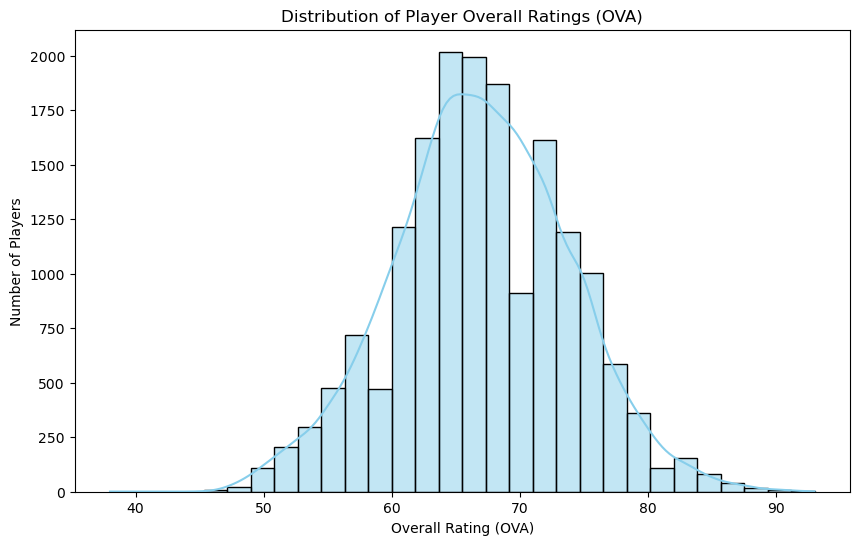

In [53]:
plt.figure(figsize=(10,6))
sns.histplot(fifa['OVA'], bins=30, kde=True, color='skyblue')
plt.title("Distribution of Player Overall Ratings (OVA)")
plt.xlabel("Overall Rating (OVA)")
plt.ylabel("Number of Players")
plt.show()

7. Step: What is the relationship between player value and overall rating?
Question: Is there a correlation between player value and overall rating?

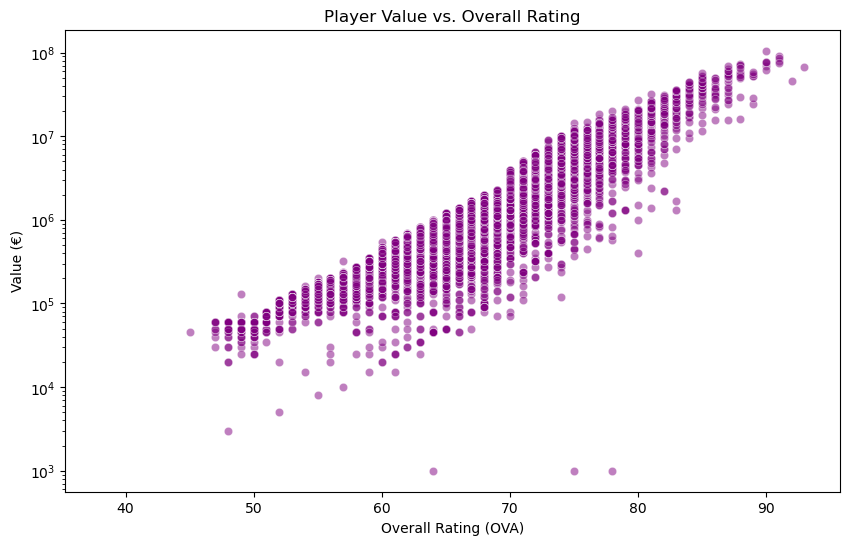

In [55]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='OVA', y='ValueNum', data=fifa, alpha=0.5, color='purple')
plt.title("Player Value vs. Overall Rating")
plt.xlabel("Overall Rating (OVA)")
plt.ylabel("Value (€)")
plt.yscale('log')
plt.show()

8. Step: Which countries have the most players in the dataset?
Question: Which nationalities are most represented among players?

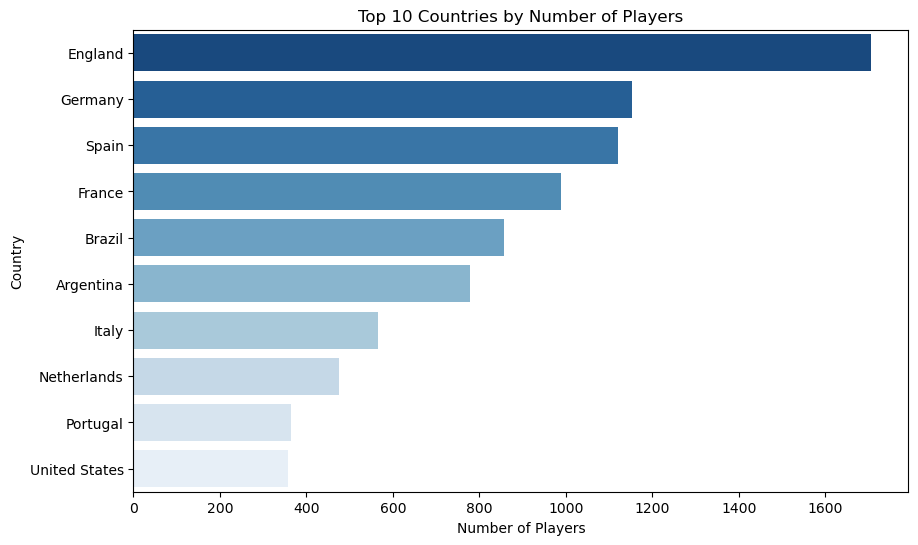

In [56]:
top_countries = fifa['Nationality'].value_counts().head(10)
plt.figure(figsize=(10,6))
sns.barplot(x=top_countries.values, y=top_countries.index, palette="Blues_r")
plt.title("Top 10 Countries by Number of Players")
plt.xlabel("Number of Players")
plt.ylabel("Country")
plt.show()

9. Step: What is the distribution of preferred foot among players?
Question: What is the ratio of right-footed to left-footed players?

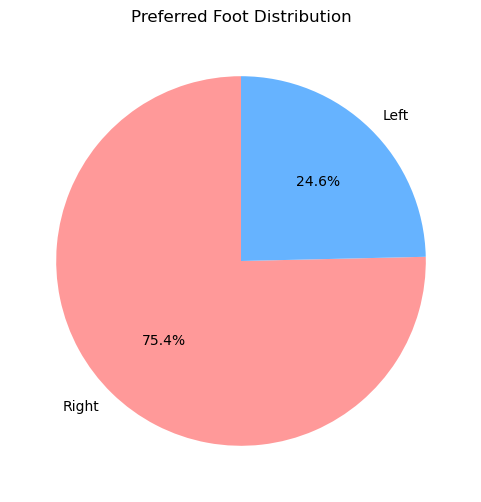

In [57]:
plt.figure(figsize=(6,6))
fifa['foot'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b3ff'])
plt.title("Preferred Foot Distribution")
plt.ylabel("")
plt.show()

11. Step: What is the distribution of player positions?
Question: What is the proportion of each player position in the dataset?


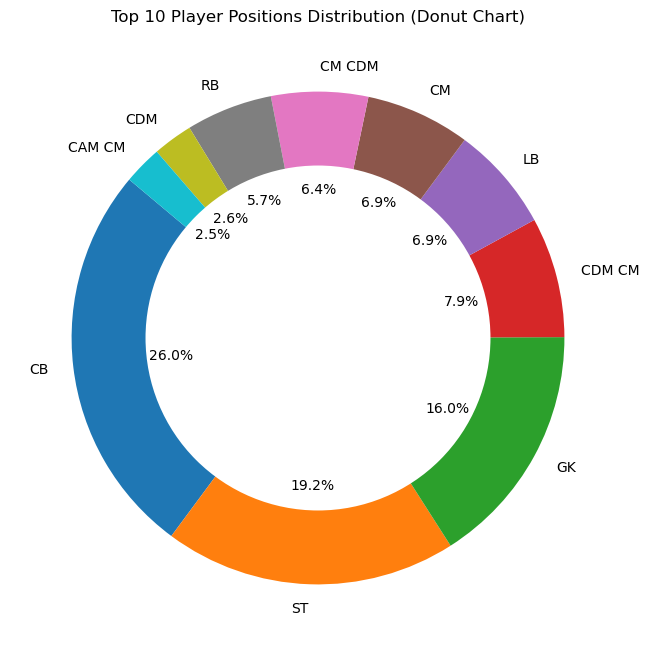

In [62]:
position_counts = fifa['Position'].value_counts().head(10)
plt.figure(figsize=(8,8))
plt.pie(position_counts, labels=position_counts.index, startangle=140, autopct='%1.1f%%', wedgeprops=dict(width=0.4))
plt.title("Top 10 Player Positions Distribution (Donut Chart)")
plt.gca().add_artist(plt.Circle((0,0),0.70,fc='white'))
plt.show()

12. Step: How do player wages vary by club?
Question: Which clubs pay the highest average wages?


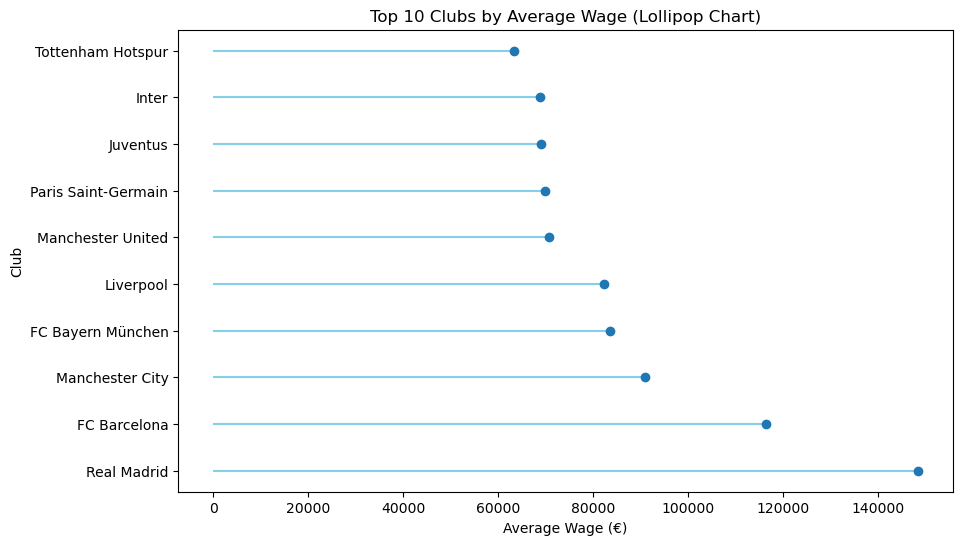

In [64]:
# Convert Wage to numeric
def wage_to_float(x):
    if isinstance(x, str):
        if 'M' in x:
            return float(x.replace('€','').replace('M','')) * 1e6
        if 'K' in x:
            return float(x.replace('€','').replace('K','')) * 1e3
    return 0

fifa['WageNum'] = fifa['Wage'].apply(wage_to_float)
club_wage = fifa.groupby('Club')['WageNum'].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(10,6))
plt.hlines(y=club_wage.index, xmin=0, xmax=club_wage.values, color='skyblue')
plt.plot(club_wage.values, club_wage.index, "o")
plt.title("Top 10 Clubs by Average Wage (Lollipop Chart)")
plt.xlabel("Average Wage (€)")
plt.ylabel("Club")
plt.show()

13. Step: How are players distributed by age and overall rating?
Question: What is the joint distribution of age and overall rating?


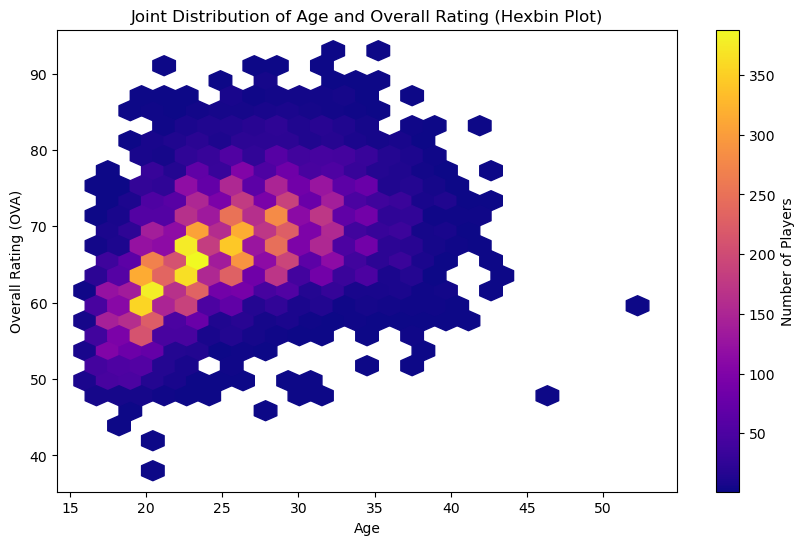

In [65]:
plt.figure(figsize=(10,6))
plt.hexbin(fifa['Age'], fifa['OVA'], gridsize=25, cmap='plasma', mincnt=1)
plt.colorbar(label='Number of Players')
plt.title("Joint Distribution of Age and Overall Rating (Hexbin Plot)")
plt.xlabel("Age")
plt.ylabel("Overall Rating (OVA)")
plt.show()

14. Step: How do player values differ by nationality?
Question: Which countries have the highest average player value?


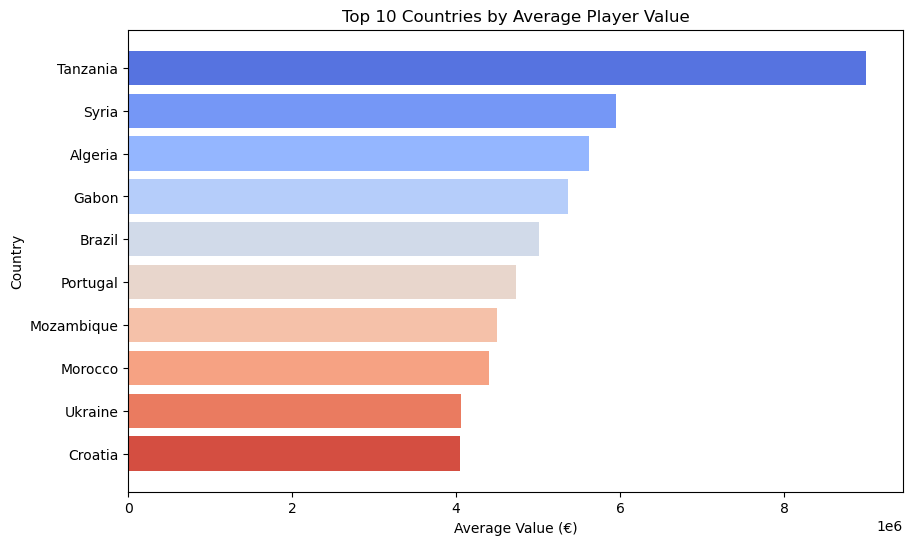

In [66]:
top_countries_value = fifa.groupby('Nationality')['ValueNum'].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(10,6))
colors = sns.color_palette("coolwarm", len(top_countries_value))
plt.barh(top_countries_value.index, top_countries_value.values, color=colors)
plt.title("Top 10 Countries by Average Player Value")
plt.xlabel("Average Value (€)")
plt.ylabel("Country")
plt.gca().invert_yaxis()
plt.show()

15. Step: How do key attributes compare for top players?
Question: How do the main attributes (PAC, SHO, PAS, DRI, DEF, PHY) compare for the top 5 players?


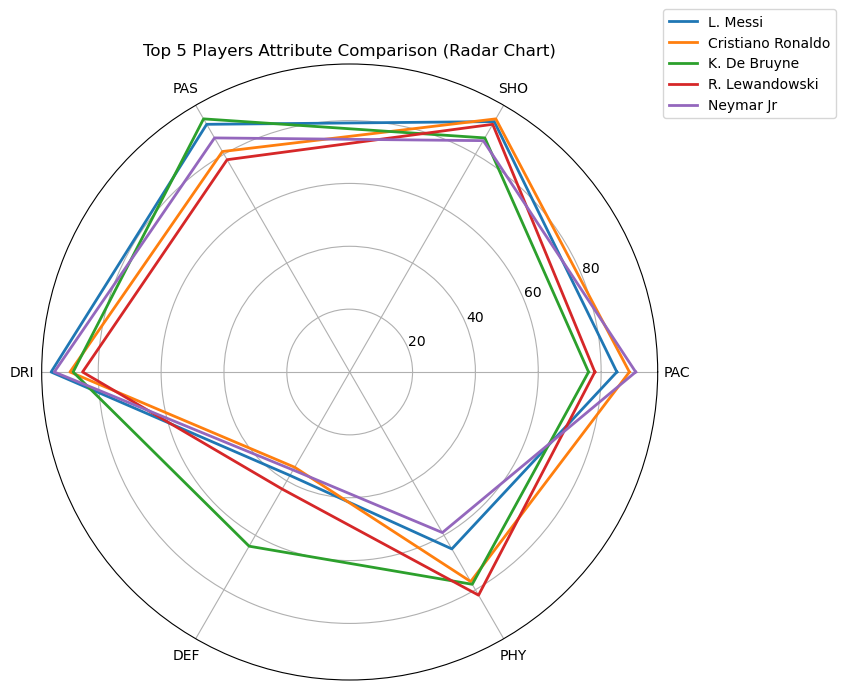

In [67]:
from math import pi

# Select top 5 players by OVA
top5 = fifa.sort_values('OVA', ascending=False).head(5)
attributes = ['PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY']

# Prepare data for radar chart
values = [top5[attr].values for attr in attributes]
labels = top5['Name'].values

# Radar chart setup
angles = [n / float(len(attributes)) * 2 * pi for n in range(len(attributes))]
angles += angles[:1]

plt.figure(figsize=(8,8))
for i, player in enumerate(labels):
    stats = [top5.iloc[i][attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=player, linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Top 5 Players Attribute Comparison (Radar Chart)")
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()

16. Step: How do overall ratings and values change with age?
Question: How do overall rating and value change with age?


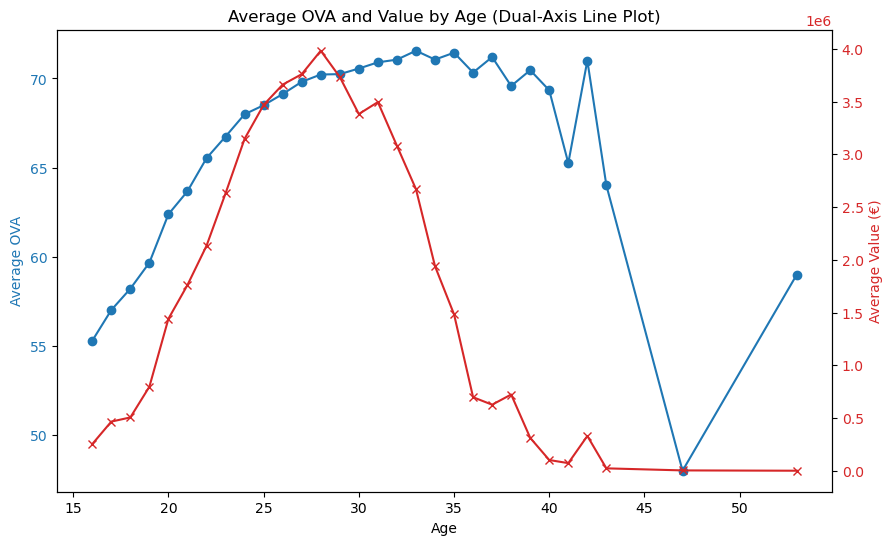

In [68]:
age_group = fifa.groupby('Age').agg({'OVA':'mean', 'ValueNum':'mean'}).reset_index()

fig, ax1 = plt.subplots(figsize=(10,6))
color = 'tab:blue'
ax1.set_xlabel('Age')
ax1.set_ylabel('Average OVA', color=color)
ax1.plot(age_group['Age'], age_group['OVA'], color=color, marker='o')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Value (€)', color=color)
ax2.plot(age_group['Age'], age_group['ValueNum'], color=color, marker='x')
ax2.tick_params(axis='y', labelcolor=color)

plt.title("Average OVA and Value by Age (Dual-Axis Line Plot)")
plt.show()

17. Step: What is the correlation between all main attributes?
Question: What are the correlations between main player attributes?


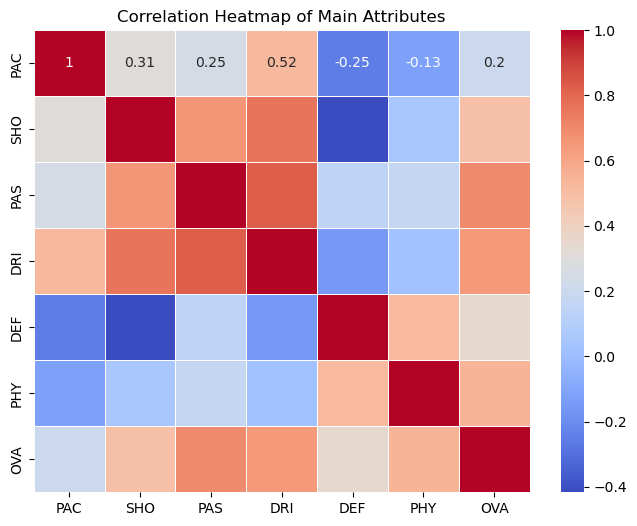

In [69]:
main_attrs = ['PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY', 'OVA']
corr = fifa[main_attrs].corr()

plt.figure(figsize=(8,6))
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Heatmap of Main Attributes")
plt.show()

18. Step: How do top clubs compare in multiple attributes?
Question: How do the top 5 clubs compare in average PAC, SHO, and OVA?


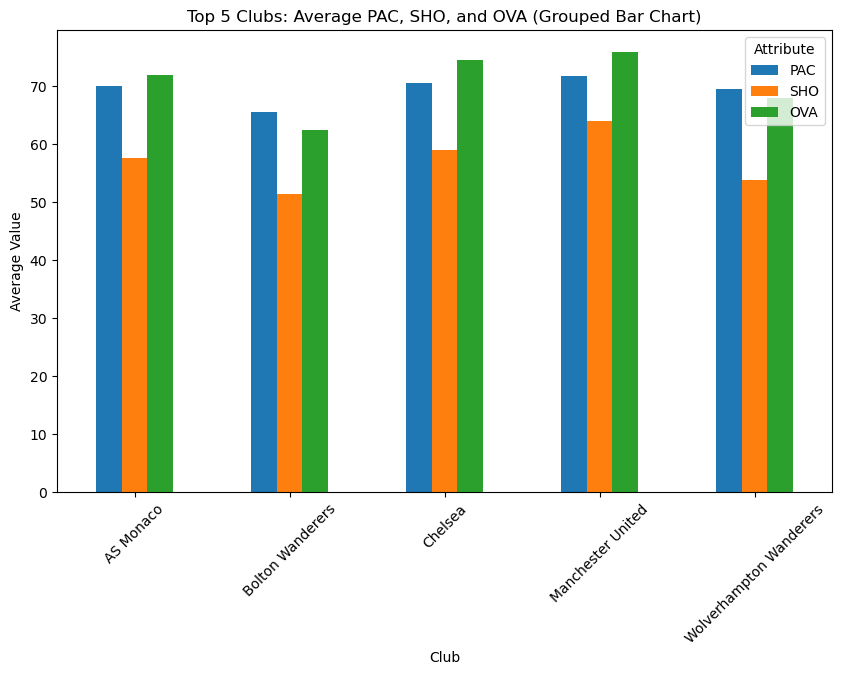

In [70]:
top5_clubs = fifa['Club'].value_counts().head(5).index
club_stats = fifa[fifa['Club'].isin(top5_clubs)].groupby('Club')[['PAC','SHO','OVA']].mean().reset_index()
club_stats = club_stats.set_index('Club')

club_stats.plot(kind='bar', figsize=(10,6))
plt.title("Top 5 Clubs: Average PAC, SHO, and OVA (Grouped Bar Chart)")
plt.ylabel("Average Value")
plt.xticks(rotation=45)
plt.legend(title="Attribute")
plt.show()

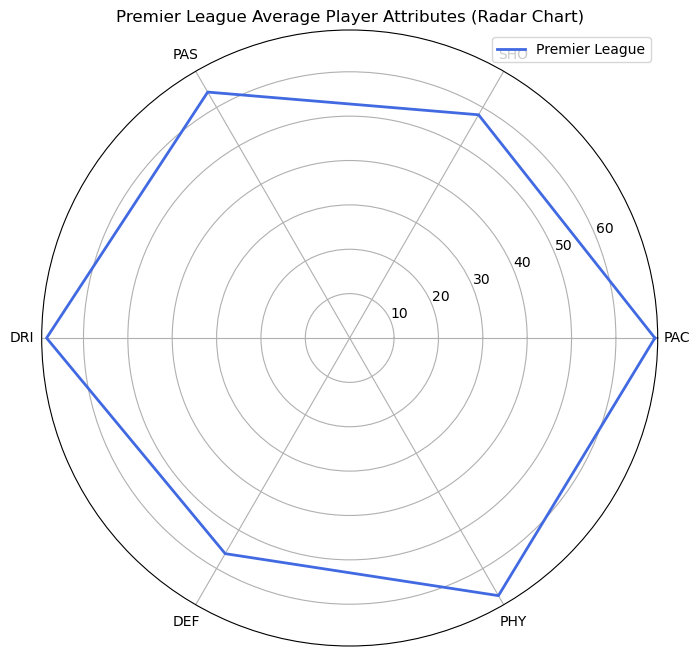

In [72]:
# Step 1: Filter English Premier League players
premier_league_clubs = [
    'Arsenal', 'Aston Villa', 'Brighton & Hove Albion', 'Burnley', 'Chelsea', 'Crystal Palace',
    'Everton', 'Fulham', 'Leeds United', 'Leicester City', 'Liverpool', 'Manchester City',
    'Manchester United', 'Newcastle United', 'Sheffield United', 'Southampton', 'Tottenham Hotspur',
    'West Bromwich Albion', 'West Ham United', 'Wolverhampton Wanderers'
]

england_df = fifa[fifa['Club'].isin(premier_league_clubs)]

# Step 2: Compare average key attributes for Premier League players (Radar Chart)
attributes = ['PAC', 'SHO', 'PAS', 'DRI', 'DEF', 'PHY']
avg_attrs = [england_df[attr].mean() for attr in attributes]

from math import pi
angles = [n / float(len(attributes)) * 2 * pi for n in range(len(attributes))]
angles += angles[:1]
stats = avg_attrs + avg_attrs[:1]

plt.figure(figsize=(8,8))
plt.polar(angles, stats, label='Premier League', linewidth=2, color='royalblue')
plt.xticks(angles[:-1], attributes)
plt.title("Premier League Average Player Attributes (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

Premier League

1.1. Best Striker (ST) vs Best Winger (LW/RW)
Question: Who is the best striker and who is the best winger in the Premier League?


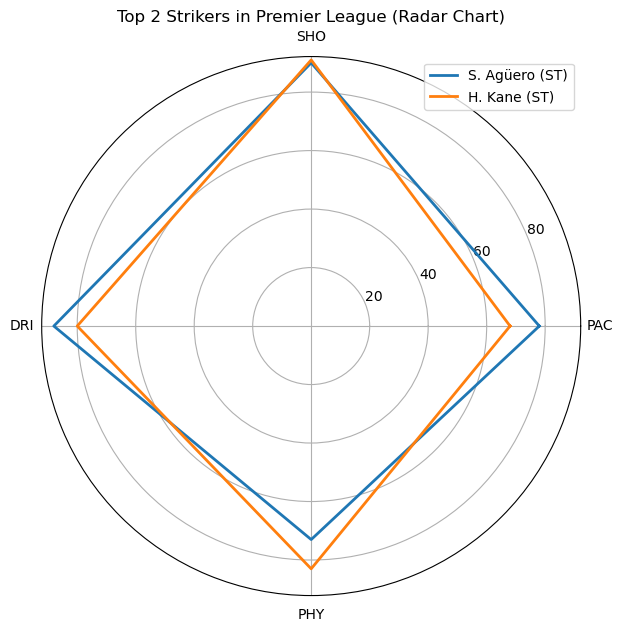

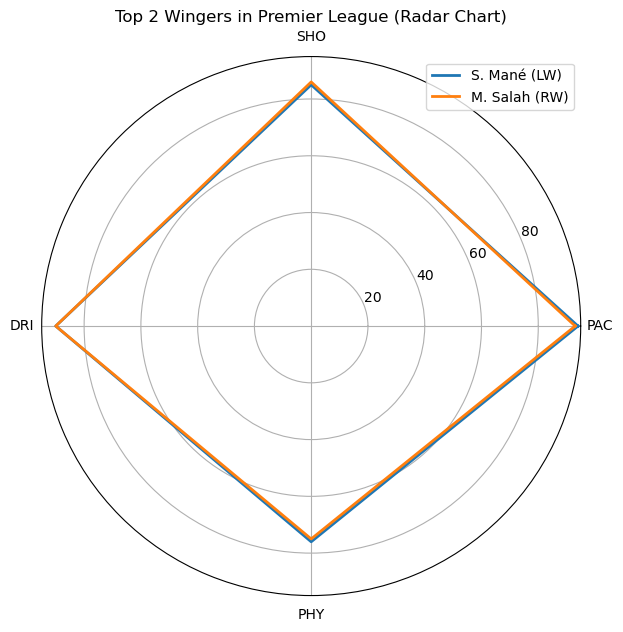

In [113]:
from math import pi

# Find top 2 strikers (ST) and top 2 wingers (LW/RW) by OVA
top2_strikers = england_df[england_df['Position'] == 'ST'].sort_values('OVA', ascending=False).head(2)
top2_wingers = england_df[england_df['Position'].isin(['LW', 'RW'])].sort_values('OVA', ascending=False).head(2)

attributes = ['PAC', 'SHO', 'DRI', 'PHY']
angles = [n / float(len(attributes)) * 2 * pi for n in range(len(attributes))]
angles += angles[:1]

# Radar chart for Strikers
plt.figure(figsize=(7,7))
for _, player in top2_strikers.iterrows():
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=f"{player['Name']} (ST)", linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Top 2 Strikers in Premier League (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

# Radar chart for Wingers
plt.figure(figsize=(7,7))
for _, player in top2_wingers.iterrows():
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=f"{player['Name']} ({player['Position']})", linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Top 2 Wingers in Premier League (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

1.2. Best Central Midfielder (CM/CAM/CDM) vs Best Defender (CB)
Question: Who is the best midfielder and who is the best central defender in the Premier League?


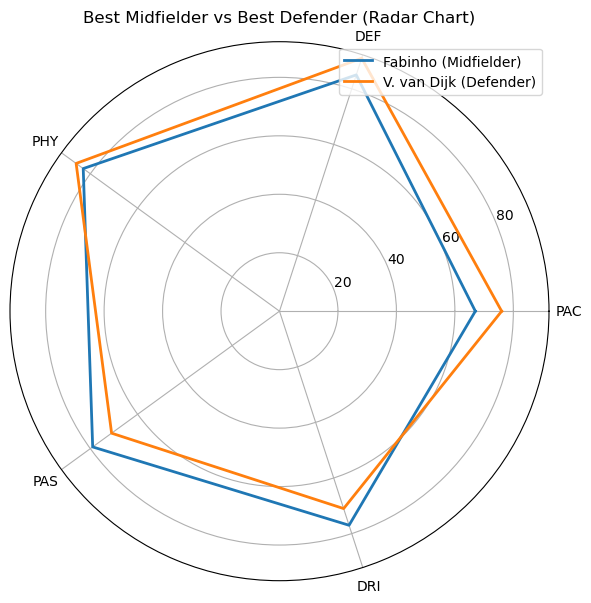

In [75]:
# Best Midfielder
best_mid = england_df[england_df['Position'].isin(['CM', 'CAM', 'CDM'])].sort_values('OVA', ascending=False).iloc[0]
# Best Central Defender
best_cb = england_df[england_df['Position'] == 'CB'].sort_values('OVA', ascending=False).iloc[0]

# Radar chart
from math import pi
attributes = ['PAC', 'DEF', 'PHY', 'PAS', 'DRI']
players = [best_mid, best_cb]
labels = [f"{best_mid['Name']} (Midfielder)", f"{best_cb['Name']} (Defender)"]

angles = [n / float(len(attributes)) * 2 * pi for n in range(len(attributes))]
angles += angles[:1]

plt.figure(figsize=(7,7))
for i, player in enumerate(players):
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=labels[i], linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Best Midfielder vs Best Defender (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

1.3. Best Fullback (LB/RB) vs Best Goalkeeper
Question: Who is the best fullback and who is the best goalkeeper in the Premier League?




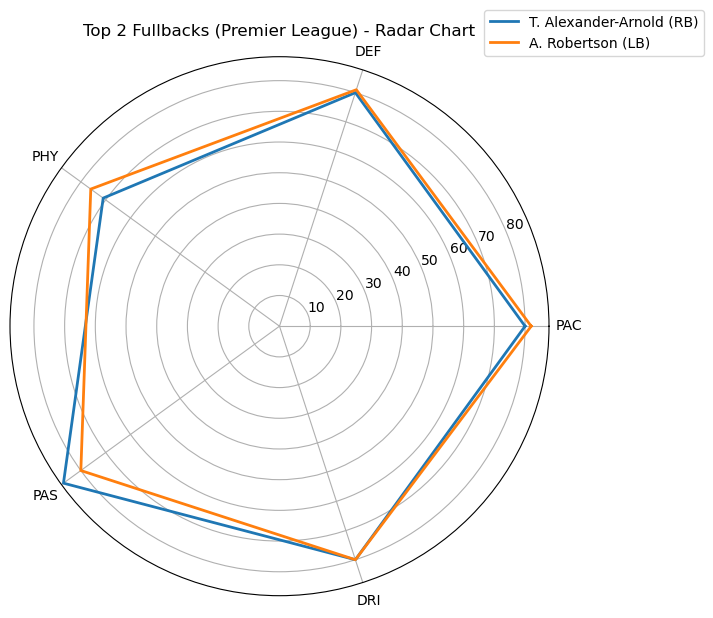

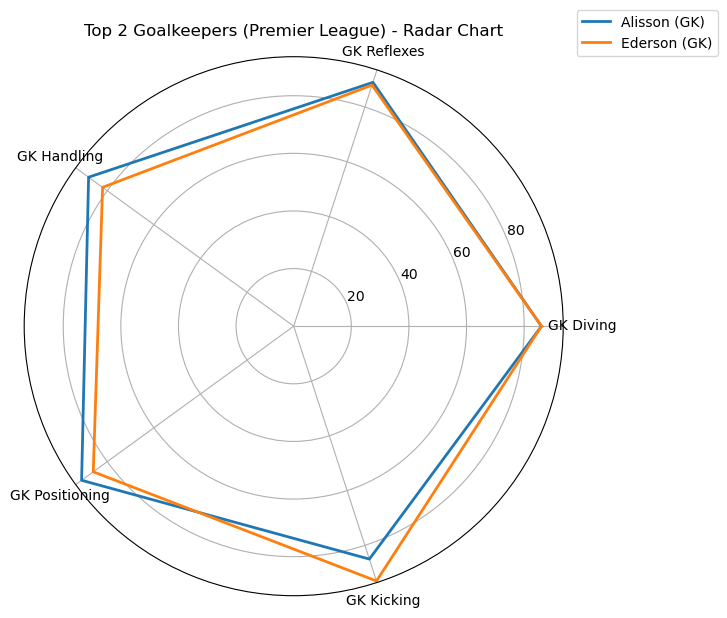

In [ ]:
from math import pi

# Select the best two fullbacks and the best two goalkeepers
best_fullbacks = england_df[england_df['Position'].isin(['LB', 'RB'])].sort_values('OVA', ascending=False).head(2)
best_goalkeepers = england_df[england_df['Position'] == 'GK'].sort_values('OVA', ascending=False).head(2)

# Attributes for radar chart
fb_attributes = ['PAC', 'DEF', 'PHY', 'PAS', 'DRI']
gk_attributes = ['GK Diving', 'GK Reflexes', 'GK Handling', 'GK Positioning', 'GK Kicking']

# Radar angles
fb_angles = [n / float(len(fb_attributes)) * 2 * pi for n in range(len(fb_attributes))]
fb_angles += fb_angles[:1]
gk_angles = [n / float(len(gk_attributes)) * 2 * pi for n in range(len(gk_attributes))]
gk_angles += gk_angles[:1]

# Fullback radar chart
plt.figure(figsize=(7,7))
for _, player in best_fullbacks.iterrows():
    stats = [player[attr] for attr in fb_attributes]
    stats += stats[:1]
    plt.polar(fb_angles, stats, label=f"{player['Name']} ({player['Position']})", linewidth=2)
plt.xticks(fb_angles[:-1], fb_attributes)
plt.title("Top 2 Fullbacks (Premier League) - Radar Chart")
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()

# Goalkeeper radar chart
plt.figure(figsize=(7,7))
for _, player in best_goalkeepers.iterrows():
    stats = [player[attr] for attr in gk_attributes]
    stats += stats[:1]
    plt.polar(gk_angles, stats, label=f"{player['Name']} (GK)", linewidth=2)
plt.xticks(gk_angles[:-1], gk_attributes)
plt.title("Top 2 Goalkeepers (Premier League) - Radar Chart")
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()

In [78]:
!pip install mplsoccer

   ---------------------------------------- 0.0/86.2 kB ? eta -:--:--
   ---- ----------------------------------- 10.2/86.2 kB ? eta -:--:--
   ---- ----------------------------------- 10.2/86.2 kB ? eta -:--:--
   -------------- ------------------------- 30.7/86.2 kB 262.6 kB/s eta 0:00:01
   -------------------------------------- - 81.9/86.2 kB 512.0 kB/s eta 0:00:01
   ---------------------------------------- 86.2/86.2 kB 486.9 kB/s eta 0:00:00


In [93]:
import numpy as np

# Example formations and their positions
formations = {
    '4-3-3': ['GK', 'RB', 'CB1', 'CB2', 'LB', 'CDM', 'CM', 'CAM', 'RW', 'ST', 'LW'],
    '4-4-2': ['GK', 'RB', 'CB1', 'CB2', 'LB', 'RM', 'CM1', 'CM2', 'LM', 'ST1', 'ST2'],
    '3-5-2': ['GK', 'CB1', 'CB2', 'CB3', 'RM', 'LM', 'CDM', 'CM', 'CAM', 'ST1', 'ST2']
}

def position_score(row, position):
    if position in ['ST', 'LW', 'RW']:
        return 0.4*row['OVA'] + 0.3*row['PAC'] + 0.2*row['SHO'] + 0.1*row['DRI']
    elif position in ['CM', 'CAM', 'CDM']:
        return 0.4*row['OVA'] + 0.2*row['PAS'] + 0.2*row['DRI'] + 0.2*row['DEF']
    elif position in ['CB', 'LB', 'RB']:
        return 0.4*row['OVA'] + 0.3*row['DEF'] + 0.2*row['PHY'] + 0.1*row['PAC']
    elif position == 'GK':
        return 0.5*row['OVA'] + 0.2*row['GK Reflexes'] + 0.2*row['GK Diving'] + 0.1*row['GK Handling']
    else:
        return row['OVA']

results = {}
for form_name, pos_list in formations.items():
    used_players = set()
    squad = {}
    for pos in pos_list:
        # Find suitable player for the position, otherwise pick the best unused player
        candidates = england_df[england_df['Position'].str.contains(pos[:2].replace('1','').replace('2','').replace('3',''))].copy()
        candidates['score'] = candidates.apply(lambda row: position_score(row, pos[:2]), axis=1)
        candidates = candidates.sort_values('score', ascending=False)
        for idx, row in candidates.iterrows():
            if row['Name'] not in used_players:
                squad[pos] = row
                used_players.add(row['Name'])
                break
        if pos not in squad:
            unused = england_df[~england_df['Name'].isin(used_players)].copy()
            unused['score'] = unused.apply(lambda row: position_score(row, row['Position']), axis=1)
            unused = unused.sort_values('score', ascending=False)
            if not unused.empty:
                squad[pos] = unused.iloc[0]
                used_players.add(unused.iloc[0]['Name'])
    # Calculate team score (example: OVA + DEF + SHO average)
    ova = np.mean([p['OVA'] for p in squad.values()])
    defense = np.mean([p['DEF'] for p in squad.values() if 'DEF' in p])
    attack = np.mean([p['SHO'] for p in squad.values() if 'SHO' in p])
    balance = -abs(defense - attack)
    team_score = ova + 0.5*defense + 0.5*attack + 0.2*balance
    results[form_name] = {'squad': squad, 'score': team_score}

# Find the best formation and squad
best_formation = max(results, key=lambda k: results[k]['score'])
best_squad = results[best_formation]['squad']
print(f"Best formation: {best_formation} with score {results[best_formation]['score']:.2f}")

Best formation: 4-3-3 with score 157.43


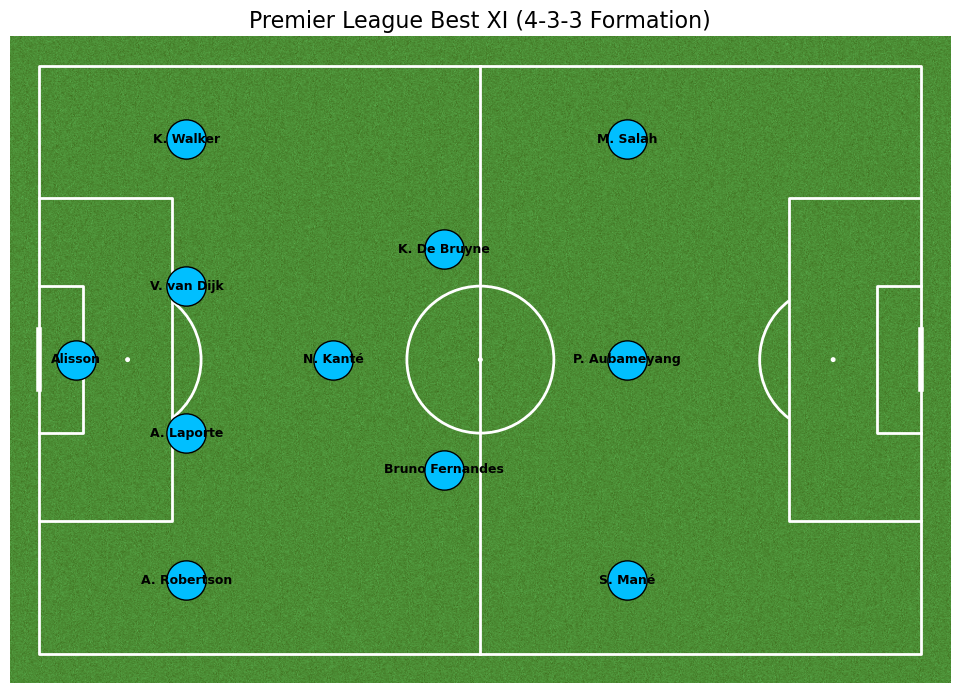

In [94]:
from mplsoccer import Pitch
import matplotlib.pyplot as plt

# Define pitch coordinates for each formation
formation_coords_dict = {
    '4-3-3': {
        'GK': (5, 40),
        'RB': (20, 10),
        'CB1': (20, 30),
        'CB2': (20, 50),
        'LB': (20, 70),
        'CDM': (40, 40),
        'CM': (55, 25),
        'CAM': (55, 55),
        'RW': (80, 10),
        'ST': (80, 40),
        'LW': (80, 70)
    },
    '4-4-2': {
        'GK': (5, 40),
        'RB': (20, 10),
        'CB1': (20, 25),
        'CB2': (20, 55),
        'LB': (20, 70),
        'RM': (55, 10),
        'CM1': (45, 30),
        'CM2': (45, 50),
        'LM': (55, 70),
        'ST1': (80, 30),
        'ST2': (80, 50)
    },
    '3-5-2': {
        'GK': (5, 40),
        'CB1': (20, 20),
        'CB2': (20, 40),
        'CB3': (20, 60),
        'RM': (55, 10),
        'LM': (55, 70),
        'CDM': (40, 40),
        'CM': (55, 30),
        'CAM': (55, 55),
        'ST1': (80, 30),
        'ST2': (80, 50)
    }
}

formation_coords = formation_coords_dict[best_formation]
player_names = {pos: best_squad[pos]['Name'] for pos in formation_coords}

pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(10, 7))

for pos, (x, y) in formation_coords.items():
    ax.scatter(x, y, s=800, color='deepskyblue', edgecolors='black', zorder=2)
    ax.text(x, y, player_names[pos], ha='center', va='center', fontsize=9, fontweight='bold', color='black', zorder=3)

plt.title(f"Premier League Best XI ({best_formation} Formation)", fontsize=16)
plt.show()

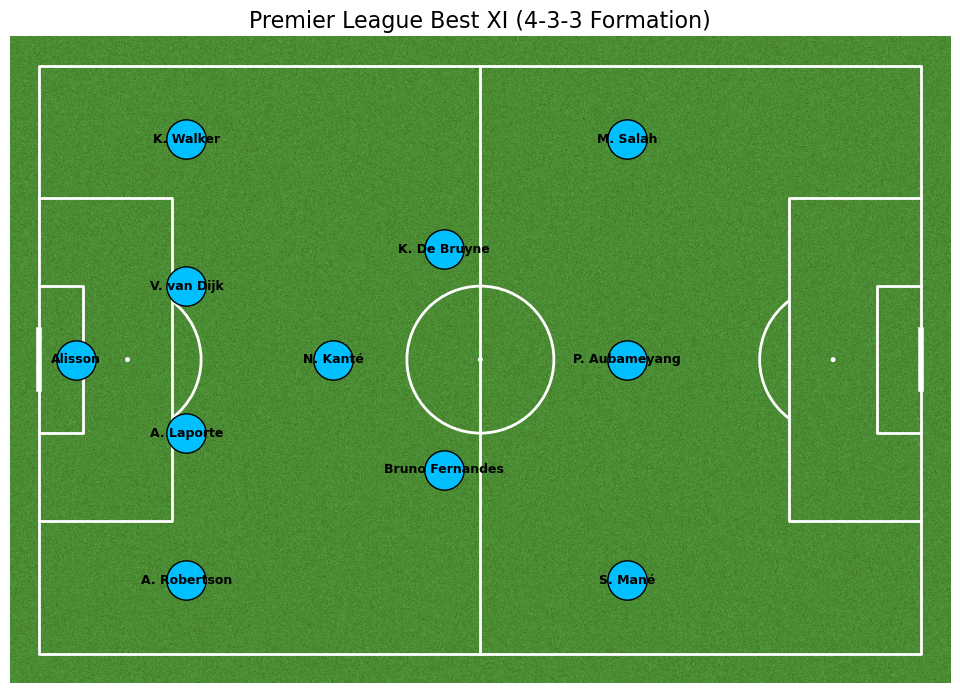

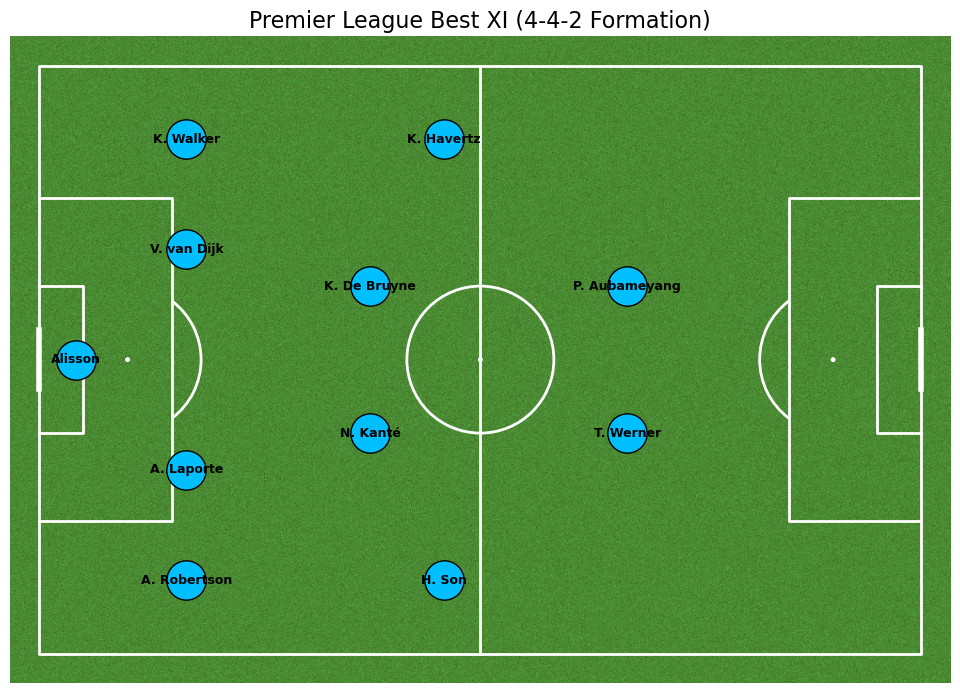

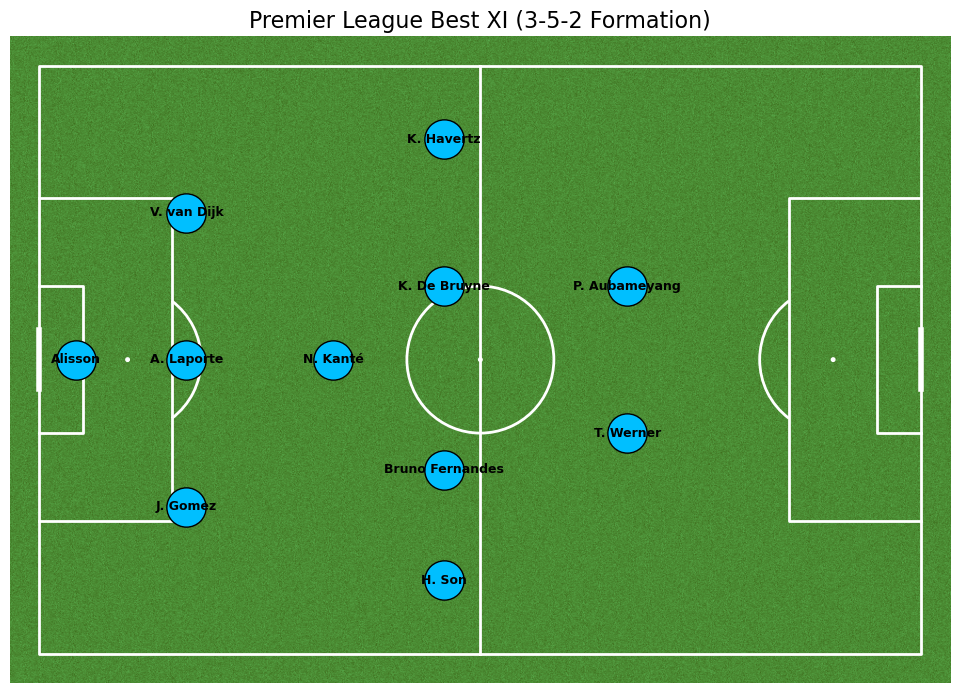

In [110]:
import numpy as np
from mplsoccer import Pitch
import matplotlib.pyplot as plt

# Example formations and positions
formations = {
    '4-3-3': ['GK', 'RB', 'CB1', 'CB2', 'LB', 'CDM', 'CM', 'CAM', 'RW', 'ST', 'LW'],
    '4-4-2': ['GK', 'RB', 'CB1', 'CB2', 'LB', 'RM', 'CM1', 'CM2', 'LM', 'ST1', 'ST2'],
    '3-5-2': ['GK', 'CB1', 'CB2', 'CB3', 'RM', 'LM', 'CDM', 'CM', 'CAM', 'ST1', 'ST2']
}

formation_coords_dict = {
    '4-3-3': {
        'GK': (5, 40),
        'RB': (20, 10),
        'CB1': (20, 30),
        'CB2': (20, 50),
        'LB': (20, 70),
        'CDM': (40, 40),
        'CM': (55, 25),
        'CAM': (55, 55),
        'RW': (80, 10),
        'ST': (80, 40),
        'LW': (80, 70)
    },
    '4-4-2': {
        'GK': (5, 40),
        'RB': (20, 10),
        'CB1': (20, 25),
        'CB2': (20, 55),
        'LB': (20, 70),
        'RM': (55, 10),
        'CM1': (45, 30),
        'CM2': (45, 50),
        'LM': (55, 70),
        'ST1': (80, 30),
        'ST2': (80, 50)
    },
    '3-5-2': {
        'GK': (5, 40),
        'CB1': (20, 20),
        'CB2': (20, 40),
        'CB3': (20, 60),
        'RM': (55, 10),
        'LM': (55, 70),
        'CDM': (40, 40),
        'CM': (55, 30),
        'CAM': (55, 55),
        'ST1': (80, 30),
        'ST2': (80, 50)
    }
}

def position_score(row, position):
    if position in ['ST', 'LW', 'RW']:
        return 0.4*row['OVA'] + 0.3*row['PAC'] + 0.2*row['SHO'] + 0.1*row['DRI']
    elif position in ['CM', 'CAM', 'CDM']:
        return 0.4*row['OVA'] + 0.2*row['PAS'] + 0.2*row['DRI'] + 0.2*row['DEF']
    elif position in ['CB', 'LB', 'RB']:
        return 0.4*row['OVA'] + 0.3*row['DEF'] + 0.2*row['PHY'] + 0.1*row['PAC']
    elif position == 'GK':
        return 0.5*row['OVA'] + 0.2*row['GK Reflexes'] + 0.2*row['GK Diving'] + 0.1*row['GK Handling']
    else:
        return row['OVA']

# Find the best XI for each formation
results = {}
for form_name, pos_list in formations.items():
    used_players = set()
    squad = {}
    for pos in pos_list:
        candidates = england_df[england_df['Position'].str.contains(pos[:2].replace('1','').replace('2','').replace('3',''))].copy()
        candidates['score'] = candidates.apply(lambda row: position_score(row, pos[:2]), axis=1)
        candidates = candidates.sort_values('score', ascending=False)
        for idx, row in candidates.iterrows():
            if row['Name'] not in used_players:
                squad[pos] = row
                used_players.add(row['Name'])
                break
        if pos not in squad:
            unused = england_df[~england_df['Name'].isin(used_players)].copy()
            unused['score'] = unused.apply(lambda row: position_score(row, row['Position']), axis=1)
            unused = unused.sort_values('score', ascending=False)
            if not unused.empty:
                squad[pos] = unused.iloc[0]
                used_players.add(unused.iloc[0]['Name'])
    results[form_name] = {'squad': squad}

# Visualize all formations for Premier League
for form_name, coords in formation_coords_dict.items():
    squad = results[form_name]['squad']
    player_names = {pos: squad[pos]['Name'] for pos in coords}
    pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
    fig, ax = pitch.draw(figsize=(10, 7))
    for pos, (x, y) in coords.items():
        ax.scatter(x, y, s=800, color='deepskyblue', edgecolors='black', zorder=2)
        ax.text(x, y, player_names[pos], ha='center', va='center', fontsize=9, fontweight='bold', color='black', zorder=3)
    plt.title(f"Premier League Best XI ({form_name} Formation)", fontsize=16)
    plt.show()

La Liga

1. Step: Filter La Liga Players
First, define the main La Liga clubs (2020-2021 season) and filter the dataset:

In [80]:
# List of La Liga clubs (2020-2021)
laliga_clubs = [
    'Alavés', 'Athletic Club', 'Atlético Madrid', 'Barcelona', 'Betis', 'Cádiz', 'Celta Vigo',
    'Eibar', 'Elche', 'Getafe', 'Granada', 'Huesca', 'Levante', 'Osasuna', 'Real Madrid',
    'Real Sociedad', 'Sevilla', 'Valencia', 'Valladolid', 'Villarreal'
]

spain_df = fifa[fifa['Club'].isin(laliga_clubs)]

2. Step: Best Player Comparison by Role (Radar and Bar Charts)
2.1. Best Striker (ST) vs Best Winger (LW/RW)
Question: Who is the best striker and who is the best winger in La Liga?

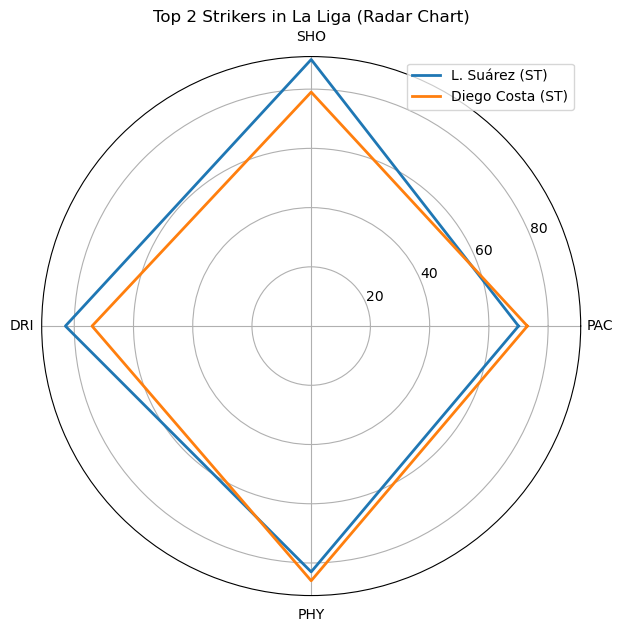

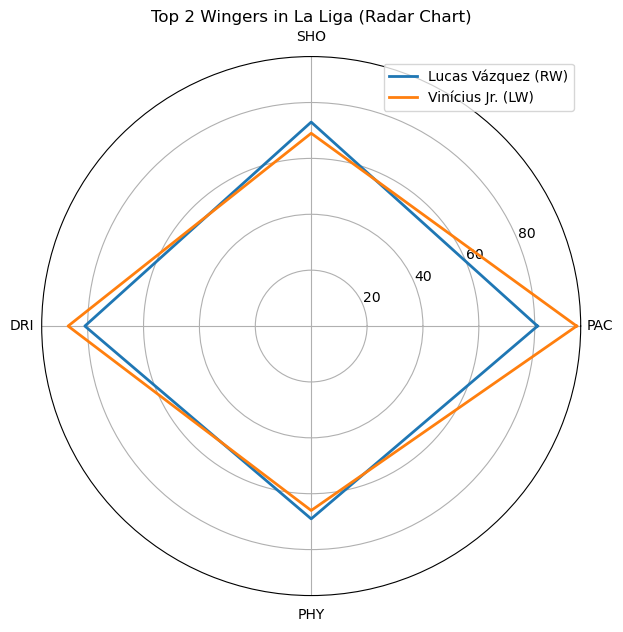

In [114]:
from math import pi

# Select top 2 strikers (ST) and top 2 wingers (LW/RW) by OVA
top2_strikers = spain_df[spain_df['Position'] == 'ST'].sort_values('OVA', ascending=False).head(2)
top2_wingers = spain_df[spain_df['Position'].isin(['LW', 'RW'])].sort_values('OVA', ascending=False).head(2)

attributes = ['PAC', 'SHO', 'DRI', 'PHY']
angles = [n / float(len(attributes)) * 2 * pi for n in range(len(attributes))]
angles += angles[:1]

# Radar chart for Strikers
plt.figure(figsize=(7,7))
for _, player in top2_strikers.iterrows():
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=f"{player['Name']} (ST)", linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Top 2 Strikers in La Liga (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

# Radar chart for Wingers
plt.figure(figsize=(7,7))
for _, player in top2_wingers.iterrows():
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=f"{player['Name']} ({player['Position']})", linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Top 2 Wingers in La Liga (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

2.2. Best Central Midfielder (CM/CAM/CDM) vs Best Defender (CB)
Question: Who is the best midfielder and who is the best central defender in La Liga?

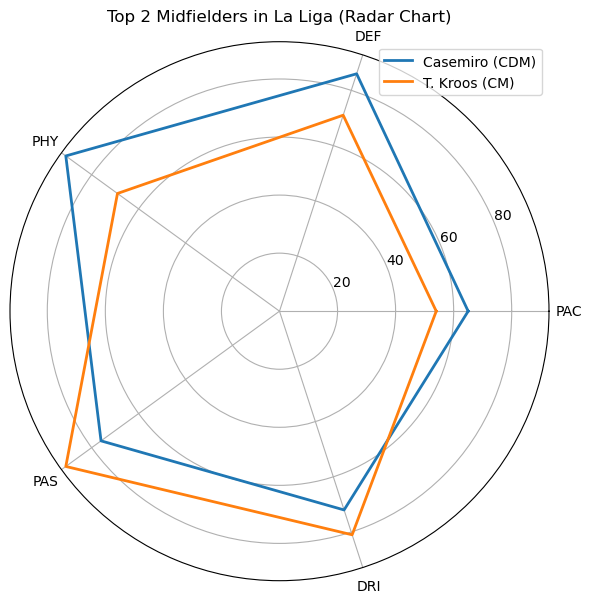

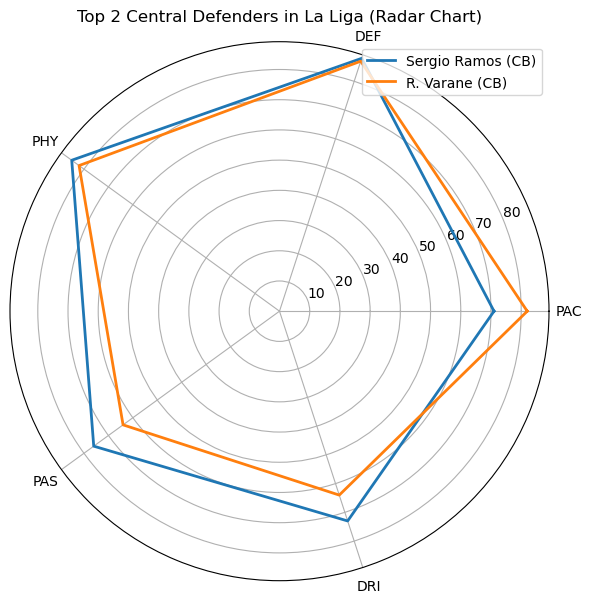

In [115]:
from math import pi

# Top 2 midfielders (CM/CAM/CDM) by OVA
top2_mids = spain_df[spain_df['Position'].isin(['CM', 'CAM', 'CDM'])].sort_values('OVA', ascending=False).head(2)
# Top 2 central defenders (CB) by OVA
top2_cbs = spain_df[spain_df['Position'] == 'CB'].sort_values('OVA', ascending=False).head(2)

attributes = ['PAC', 'DEF', 'PHY', 'PAS', 'DRI']
angles = [n / float(len(attributes)) * 2 * pi for n in range(len(attributes))]
angles += angles[:1]

# Radar chart for midfielders
plt.figure(figsize=(7,7))
for _, player in top2_mids.iterrows():
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=f"{player['Name']} ({player['Position']})", linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Top 2 Midfielders in La Liga (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

# Radar chart for central defenders
plt.figure(figsize=(7,7))
for _, player in top2_cbs.iterrows():
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=f"{player['Name']} (CB)", linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Top 2 Central Defenders in La Liga (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

2.3. Best Fullback (LB/RB) vs Best Goalkeeper
Question: Who is the best fullback and who is the best goalkeeper in La Liga?

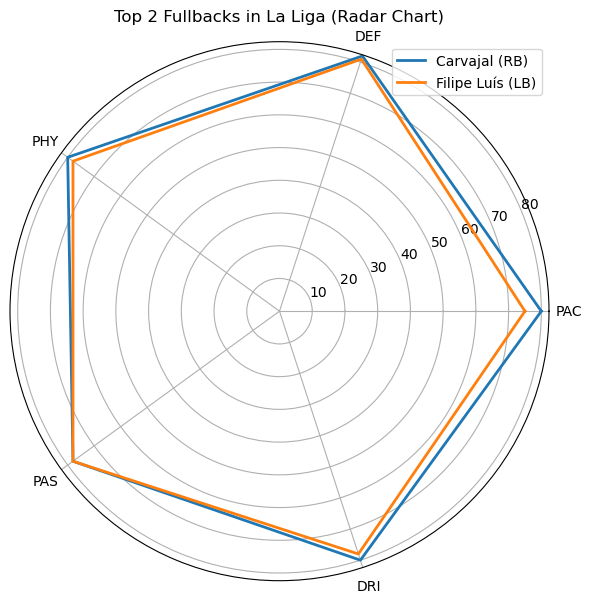

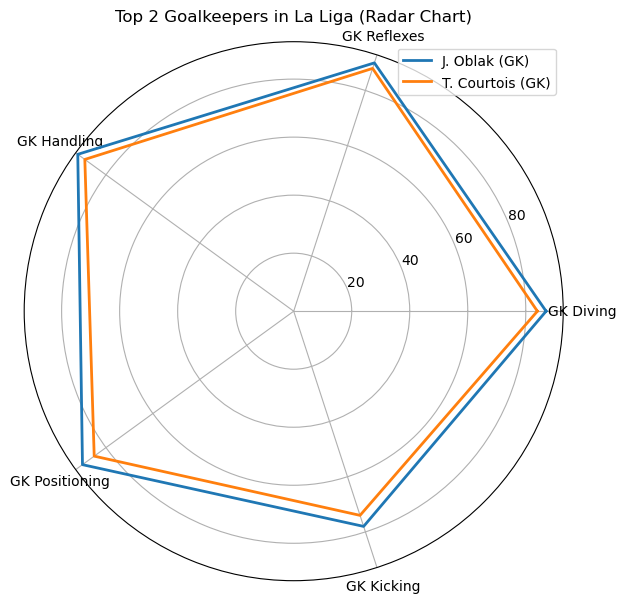

In [116]:
from math import pi

# Select top 2 fullbacks (LB/RB) and top 2 goalkeepers (GK) by OVA
top2_fullbacks = spain_df[spain_df['Position'].isin(['LB', 'RB'])].sort_values('OVA', ascending=False).head(2)
top2_goalkeepers = spain_df[spain_df['Position'] == 'GK'].sort_values('OVA', ascending=False).head(2)

# Radar chart attributes
fb_attributes = ['PAC', 'DEF', 'PHY', 'PAS', 'DRI']
gk_attributes = ['GK Diving', 'GK Reflexes', 'GK Handling', 'GK Positioning', 'GK Kicking']

# Angles for radar
fb_angles = [n / float(len(fb_attributes)) * 2 * pi for n in range(len(fb_attributes))]
fb_angles += fb_angles[:1]
gk_angles = [n / float(len(gk_attributes)) * 2 * pi for n in range(len(gk_attributes))]
gk_angles += gk_angles[:1]

# Radar chart for fullbacks
plt.figure(figsize=(7,7))
for _, player in top2_fullbacks.iterrows():
    stats = [player[attr] for attr in fb_attributes]
    stats += stats[:1]
    plt.polar(fb_angles, stats, label=f"{player['Name']} ({player['Position']})", linewidth=2)
plt.xticks(fb_angles[:-1], fb_attributes)
plt.title("Top 2 Fullbacks in La Liga (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

# Radar chart for goalkeepers
plt.figure(figsize=(7,7))
for _, player in top2_goalkeepers.iterrows():
    stats = [player[attr] for attr in gk_attributes]
    stats += stats[:1]
    plt.polar(gk_angles, stats, label=f"{player['Name']} (GK)", linewidth=2)
plt.xticks(gk_angles[:-1], gk_attributes)
plt.title("Top 2 Goalkeepers in La Liga (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

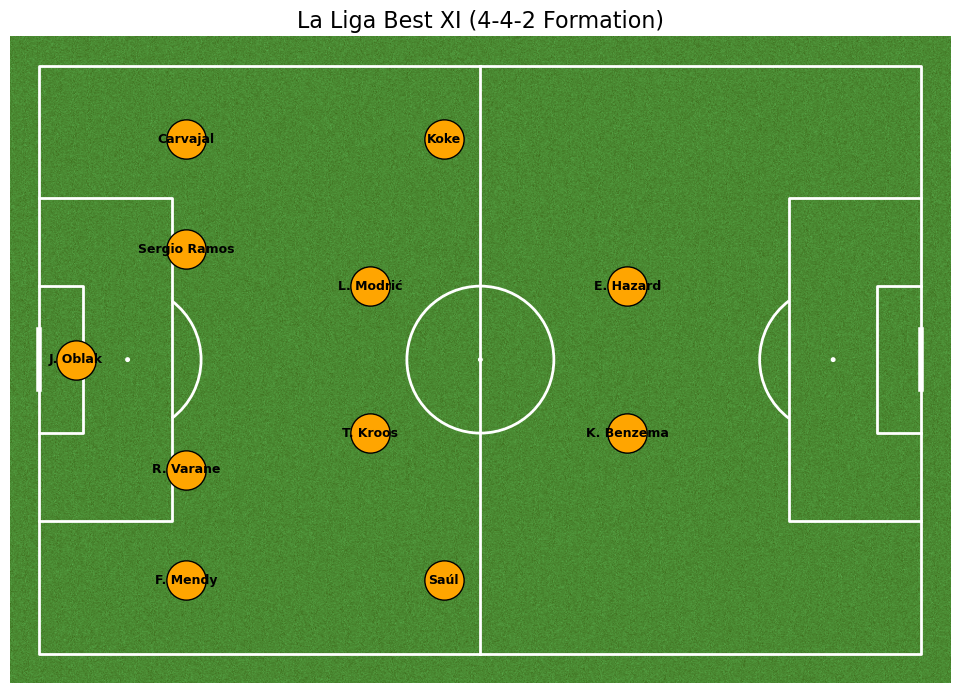

In [91]:
from mplsoccer import Pitch
import matplotlib.pyplot as plt

# 4-4-2 formation coordinates (x, y)
formation_coords_442 = {
    'GK': (5, 40),
    'RB': (20, 10),
    'CB1': (20, 25),
    'CB2': (20, 55),
    'LB': (20, 70),
    'RM': (55, 10),
    'CM1': (45, 30),
    'CM2': (45, 50),
    'LM': (55, 70),
    'ST1': (80, 30),
    'ST2': (80, 50)
}

# Get player names for each position from the best squad
best_squad = results['4-4-2']['squad']
player_names = {pos: best_squad[pos]['Name'] for pos in formation_coords_442}

# Draw the pitch and plot players
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(10, 7))

for pos, (x, y) in formation_coords_442.items():
    ax.scatter(x, y, s=800, color='orange', edgecolors='black', zorder=2)
    ax.text(x, y, player_names[pos], ha='center', va='center', fontsize=9, fontweight='bold', color='black', zorder=3)

plt.title("La Liga Best XI (4-4-2 Formation)", fontsize=16)
plt.show()

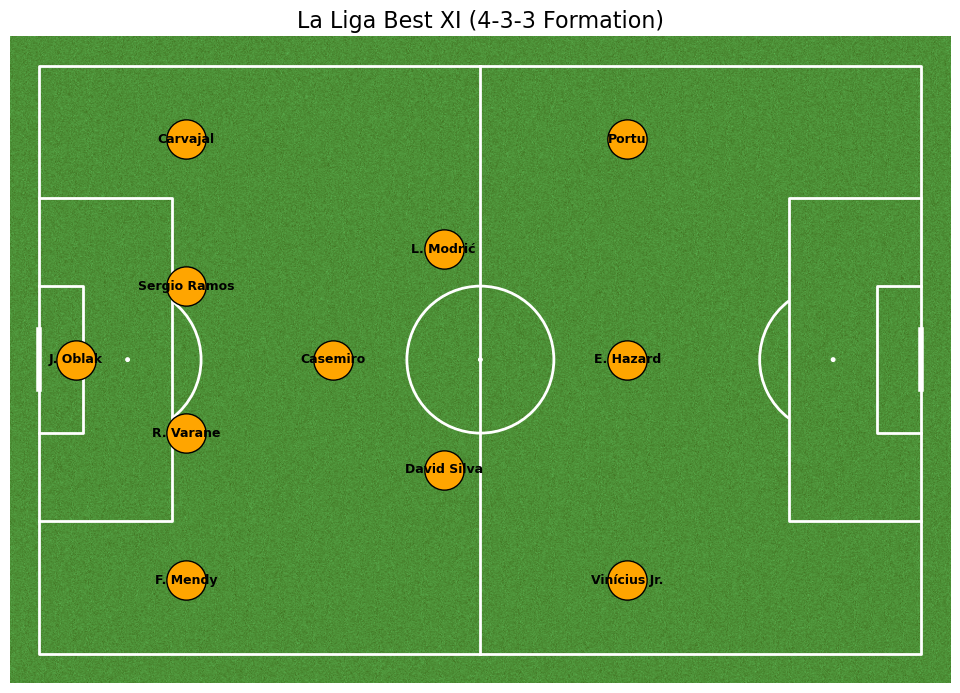

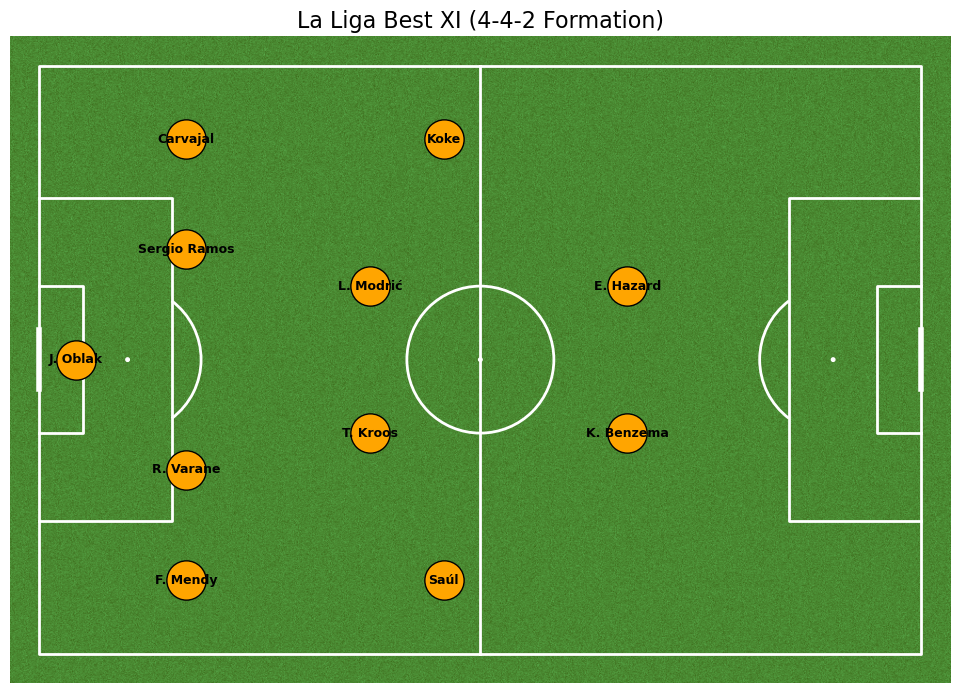

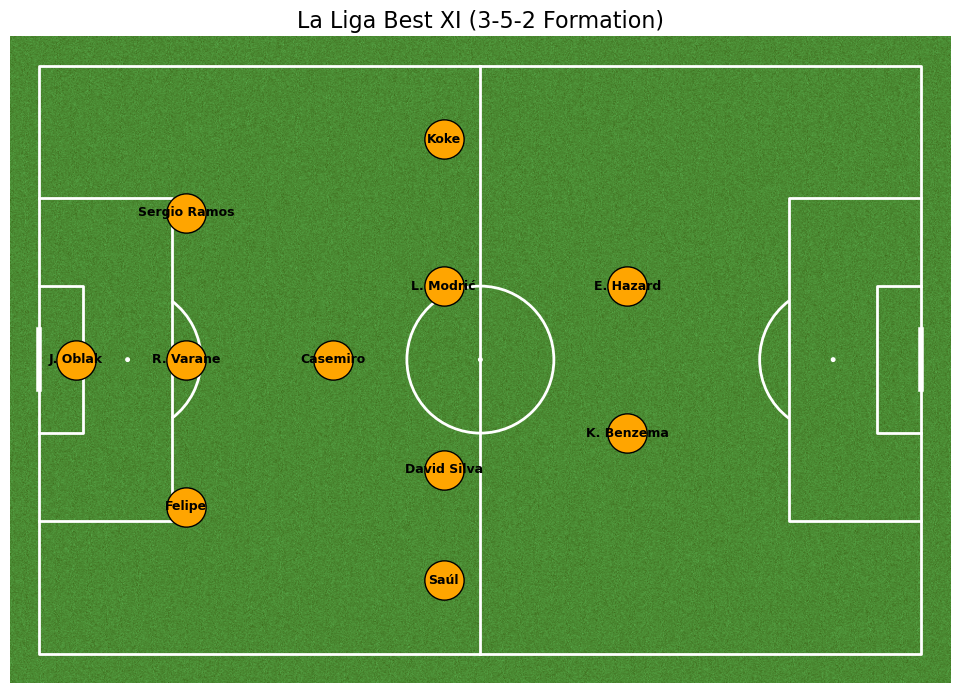

In [109]:
import numpy as np
from mplsoccer import Pitch
import matplotlib.pyplot as plt

# Example formations and positions
formations = {
    '4-3-3': ['GK', 'RB', 'CB1', 'CB2', 'LB', 'CDM', 'CM', 'CAM', 'RW', 'ST', 'LW'],
    '4-4-2': ['GK', 'RB', 'CB1', 'CB2', 'LB', 'RM', 'CM1', 'CM2', 'LM', 'ST1', 'ST2'],
    '3-5-2': ['GK', 'CB1', 'CB2', 'CB3', 'RM', 'LM', 'CDM', 'CM', 'CAM', 'ST1', 'ST2']
}

formation_coords_dict = {
    '4-3-3': {
        'GK': (5, 40),
        'RB': (20, 10),
        'CB1': (20, 30),
        'CB2': (20, 50),
        'LB': (20, 70),
        'CDM': (40, 40),
        'CM': (55, 25),
        'CAM': (55, 55),
        'RW': (80, 10),
        'ST': (80, 40),
        'LW': (80, 70)
    },
    '4-4-2': {
        'GK': (5, 40),
        'RB': (20, 10),
        'CB1': (20, 25),
        'CB2': (20, 55),
        'LB': (20, 70),
        'RM': (55, 10),
        'CM1': (45, 30),
        'CM2': (45, 50),
        'LM': (55, 70),
        'ST1': (80, 30),
        'ST2': (80, 50)
    },
    '3-5-2': {
        'GK': (5, 40),
        'CB1': (20, 20),
        'CB2': (20, 40),
        'CB3': (20, 60),
        'RM': (55, 10),
        'LM': (55, 70),
        'CDM': (40, 40),
        'CM': (55, 30),
        'CAM': (55, 55),
        'ST1': (80, 30),
        'ST2': (80, 50)
    }
}

def position_score(row, position):
    if position in ['ST', 'LW', 'RW']:
        return 0.4*row['OVA'] + 0.3*row['PAC'] + 0.2*row['SHO'] + 0.1*row['DRI']
    elif position in ['CM', 'CAM', 'CDM']:
        return 0.4*row['OVA'] + 0.2*row['PAS'] + 0.2*row['DRI'] + 0.2*row['DEF']
    elif position in ['CB', 'LB', 'RB']:
        return 0.4*row['OVA'] + 0.3*row['DEF'] + 0.2*row['PHY'] + 0.1*row['PAC']
    elif position == 'GK':
        return 0.5*row['OVA'] + 0.2*row['GK Reflexes'] + 0.2*row['GK Diving'] + 0.1*row['GK Handling']
    else:
        return row['OVA']

# Find the best XI for each formation
results = {}
for form_name, pos_list in formations.items():
    used_players = set()
    squad = {}
    for pos in pos_list:
        candidates = spain_df[spain_df['Position'].str.contains(pos[:2].replace('1','').replace('2','').replace('3',''))].copy()
        candidates['score'] = candidates.apply(lambda row: position_score(row, pos[:2]), axis=1)
        candidates = candidates.sort_values('score', ascending=False)
        for idx, row in candidates.iterrows():
            if row['Name'] not in used_players:
                squad[pos] = row
                used_players.add(row['Name'])
                break
        if pos not in squad:
            unused = spain_df[~spain_df['Name'].isin(used_players)].copy()
            unused['score'] = unused.apply(lambda row: position_score(row, row['Position']), axis=1)
            unused = unused.sort_values('score', ascending=False)
            if not unused.empty:
                squad[pos] = unused.iloc[0]
                used_players.add(unused.iloc[0]['Name'])
    results[form_name] = {'squad': squad}

# Visualize all formations for La Liga
for form_name, coords in formation_coords_dict.items():
    squad = results[form_name]['squad']
    player_names = {pos: squad[pos]['Name'] for pos in coords}
    pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
    fig, ax = pitch.draw(figsize=(10, 7))
    for pos, (x, y) in coords.items():
        ax.scatter(x, y, s=800, color='orange', edgecolors='black', zorder=2)
        ax.text(x, y, player_names[pos], ha='center', va='center', fontsize=9, fontweight='bold', color='black', zorder=3)
    plt.title(f"La Liga Best XI ({form_name} Formation)", fontsize=16)
    plt.show()

Bundesliga

1. Step: Filter Bundesliga Players


In [96]:
# List of Bundesliga clubs (2020-2021)
bundesliga_clubs = [
    'Arminia Bielefeld', 'Augsburg', 'Bayer Leverkusen', 'Bayern Munich', 'Borussia Dortmund',
    'Borussia Mönchengladbach', 'Eintracht Frankfurt', 'Freiburg', 'Hertha BSC', 'Hoffenheim',
    'Köln', 'Mainz 05', 'RB Leipzig', 'Schalke 04', 'Stuttgart', 'Union Berlin', 'Werder Bremen', 'Wolfsburg'
]

germany_df = fifa[fifa['Club'].isin(bundesliga_clubs)]

2. Step: Compare Top Players by Role with Football-Specific Graphs
2.1. Best Striker (ST) vs Best Winger (LW/RW)
Question: Who is the best striker and who is the best winger in the Bundesliga?

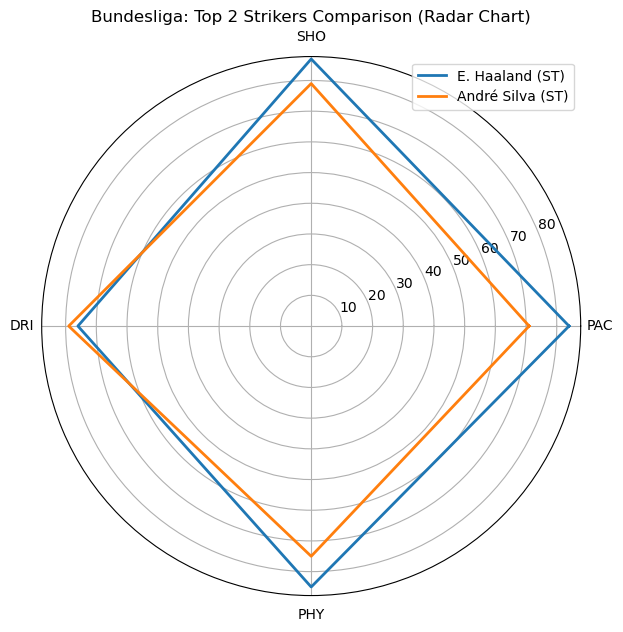

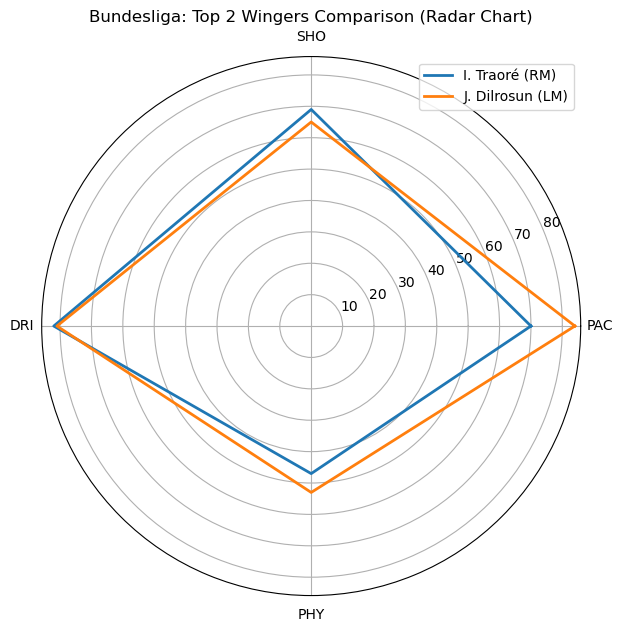

In [120]:
from math import pi

# Top 2 strikers (ST) by OVA
top2_strikers = germany_df[germany_df['Position'] == 'ST'].sort_values('OVA', ascending=False).head(2)

# Kanat oyuncuları için daha geniş pozisyon araması (LW, RW, LM, RM, LF, RF)
winger_positions = ['LW', 'RW', 'LM', 'RM', 'LF', 'RF']
top2_wingers = germany_df[germany_df['Position'].isin(winger_positions)].sort_values('OVA', ascending=False).head(2)

attributes = ['PAC', 'SHO', 'DRI', 'PHY']
angles = [n / float(len(attributes)) * 2 * pi for n in range(len(attributes))]
angles += angles[:1]

# Radar chart for Strikers
plt.figure(figsize=(7,7))
for _, player in top2_strikers.iterrows():
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=f"{player['Name']} (ST)", linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Bundesliga: Top 2 Strikers Comparison (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

# Radar chart for Wingers
plt.figure(figsize=(7,7))
for _, player in top2_wingers.iterrows():
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=f"{player['Name']} ({player['Position']})", linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Bundesliga: Top 2 Wingers Comparison (Radar Chart)")
plt.legend(loc='upper right')
plt.show()


2.2. Best Midfielder vs Best Defender
Question: Who is the best midfielder and who is the best central defender in the Bundesliga?

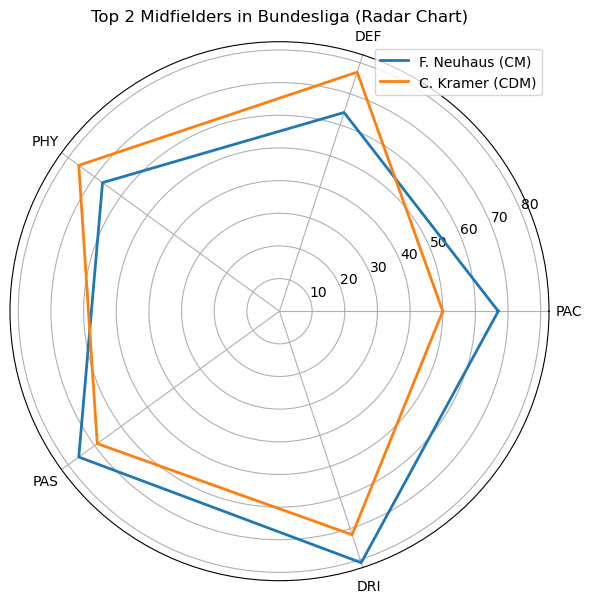

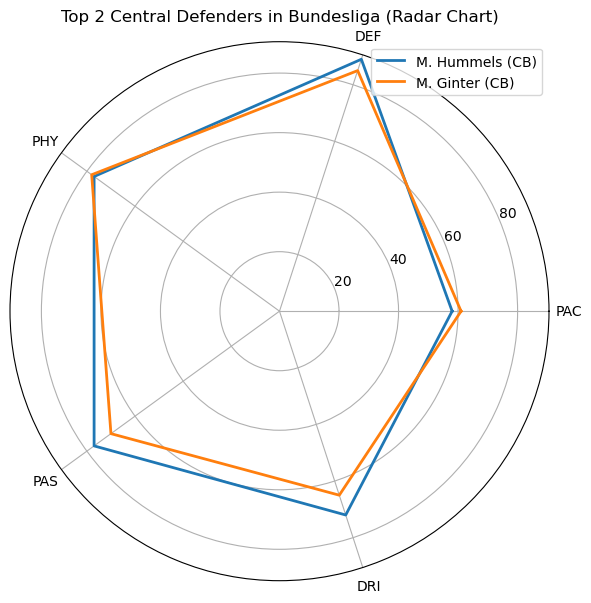

In [117]:
from math import pi

# Select top 2 midfielders and top 2 defenders by OVA
top2_mids = germany_df[germany_df['Position'].isin(['CM', 'CAM', 'CDM'])].sort_values('OVA', ascending=False).head(2)
top2_cbs = germany_df[germany_df['Position'] == 'CB'].sort_values('OVA', ascending=False).head(2)

attributes = ['PAC', 'DEF', 'PHY', 'PAS', 'DRI']
angles = [n / float(len(attributes)) * 2 * pi for n in range(len(attributes))]
angles += angles[:1]

# Radar chart for midfielders
plt.figure(figsize=(7,7))
for _, player in top2_mids.iterrows():
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=f"{player['Name']} ({player['Position']})", linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Top 2 Midfielders in Bundesliga (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

# Radar chart for central defenders
plt.figure(figsize=(7,7))
for _, player in top2_cbs.iterrows():
    stats = [player[attr] for attr in attributes]
    stats += stats[:1]
    plt.polar(angles, stats, label=f"{player['Name']} (CB)", linewidth=2)
plt.xticks(angles[:-1], attributes)
plt.title("Top 2 Central Defenders in Bundesliga (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

2.3. Best Fullback vs Best Goalkeeper
Question: Who is the best fullback and who is the best goalkeeper in the Bundesliga?

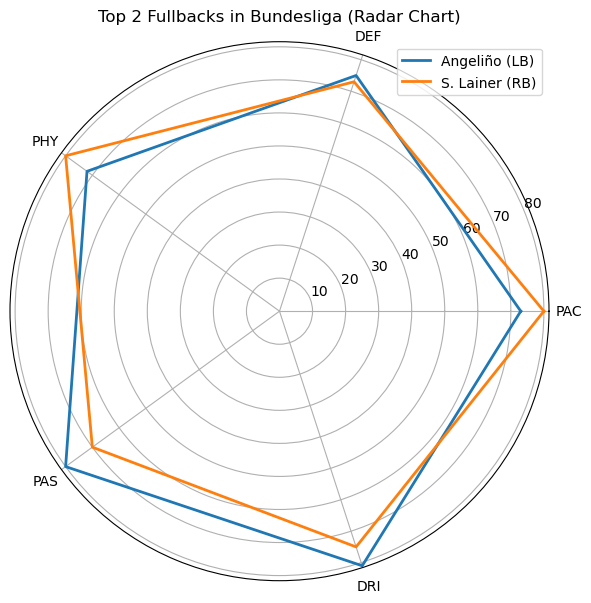

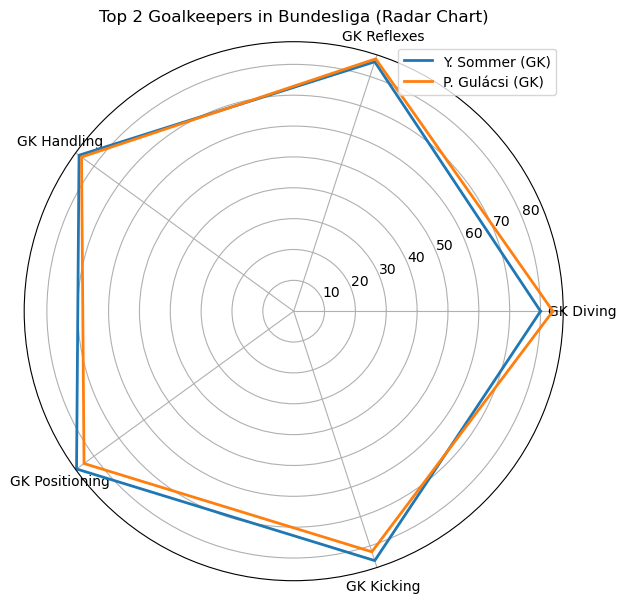

In [118]:
from math import pi

# Select top 2 fullbacks (LB/RB) and top 2 goalkeepers (GK) by OVA
top2_fullbacks = germany_df[germany_df['Position'].isin(['LB', 'RB'])].sort_values('OVA', ascending=False).head(2)
top2_goalkeepers = germany_df[germany_df['Position'] == 'GK'].sort_values('OVA', ascending=False).head(2)

# Radar chart attributes
fb_attributes = ['PAC', 'DEF', 'PHY', 'PAS', 'DRI']
gk_attributes = ['GK Diving', 'GK Reflexes', 'GK Handling', 'GK Positioning', 'GK Kicking']

# Angles for radar
fb_angles = [n / float(len(fb_attributes)) * 2 * pi for n in range(len(fb_attributes))]
fb_angles += fb_angles[:1]
gk_angles = [n / float(len(gk_attributes)) * 2 * pi for n in range(len(gk_attributes))]
gk_angles += gk_angles[:1]

# Radar chart for fullbacks
plt.figure(figsize=(7,7))
for _, player in top2_fullbacks.iterrows():
    stats = [player[attr] for attr in fb_attributes]
    stats += stats[:1]
    plt.polar(fb_angles, stats, label=f"{player['Name']} ({player['Position']})", linewidth=2)
plt.xticks(fb_angles[:-1], fb_attributes)
plt.title("Top 2 Fullbacks in Bundesliga (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

# Radar chart for goalkeepers
plt.figure(figsize=(7,7))
for _, player in top2_goalkeepers.iterrows():
    stats = [player[attr] for attr in gk_attributes]
    stats += stats[:1]
    plt.polar(gk_angles, stats, label=f"{player['Name']} (GK)", linewidth=2)
plt.xticks(gk_angles[:-1], gk_attributes)
plt.title("Top 2 Goalkeepers in Bundesliga (Radar Chart)")
plt.legend(loc='upper right')
plt.show()

In [103]:
import numpy as np

# Example formations and their positions
formations = {
    '4-3-3': ['GK', 'RB', 'CB1', 'CB2', 'LB', 'CDM', 'CM', 'CAM', 'RW', 'ST', 'LW'],
    '4-4-2': ['GK', 'RB', 'CB1', 'CB2', 'LB', 'RM', 'CM1', 'CM2', 'LM', 'ST1', 'ST2'],
    '3-5-2': ['GK', 'CB1', 'CB2', 'CB3', 'RM', 'LM', 'CDM', 'CM', 'CAM', 'ST1', 'ST2']
}

def position_score(row, position):
    if position in ['ST', 'LW', 'RW']:
        return 0.4*row['OVA'] + 0.3*row['PAC'] + 0.2*row['SHO'] + 0.1*row['DRI']
    elif position in ['CM', 'CAM', 'CDM']:
        return 0.4*row['OVA'] + 0.2*row['PAS'] + 0.2*row['DRI'] + 0.2*row['DEF']
    elif position in ['CB', 'LB', 'RB']:
        return 0.4*row['OVA'] + 0.3*row['DEF'] + 0.2*row['PHY'] + 0.1*row['PAC']
    elif position == 'GK':
        return 0.5*row['OVA'] + 0.2*row['GK Reflexes'] + 0.2*row['GK Diving'] + 0.1*row['GK Handling']
    else:
        return row['OVA']

results = {}
for form_name, pos_list in formations.items():
    used_players = set()
    squad = {}
    for pos in pos_list:
        candidates = germany_df[germany_df['Position'].str.contains(pos[:2].replace('1','').replace('2','').replace('3',''))].copy()
        candidates['score'] = candidates.apply(lambda row: position_score(row, pos[:2]), axis=1)
        candidates = candidates.sort_values('score', ascending=False)
        for idx, row in candidates.iterrows():
            if row['Name'] not in used_players:
                squad[pos] = row
                used_players.add(row['Name'])
                break
        if pos not in squad:
            unused = germany_df[~germany_df['Name'].isin(used_players)].copy()
            unused['score'] = unused.apply(lambda row: position_score(row, row['Position']), axis=1)
            unused = unused.sort_values('score', ascending=False)
            if not unused.empty:
                squad[pos] = unused.iloc[0]
                used_players.add(unused.iloc[0]['Name'])
    ova = np.mean([p['OVA'] for p in squad.values()])
    defense = np.mean([p['DEF'] for p in squad.values() if 'DEF' in p])
    attack = np.mean([p['SHO'] for p in squad.values() if 'SHO' in p])
    balance = -abs(defense - attack)
    team_score = ova + 0.5*defense + 0.5*attack + 0.2*balance
    results[form_name] = {'squad': squad, 'score': team_score}

# Find the best formation and squad
best_formation = max(results, key=lambda k: results[k]['score'])
best_squad = results[best_formation]['squad']
print(f"Best formation: {best_formation} with score {results[best_formation]['score']:.2f}")

Best formation: 4-3-3 with score 152.81


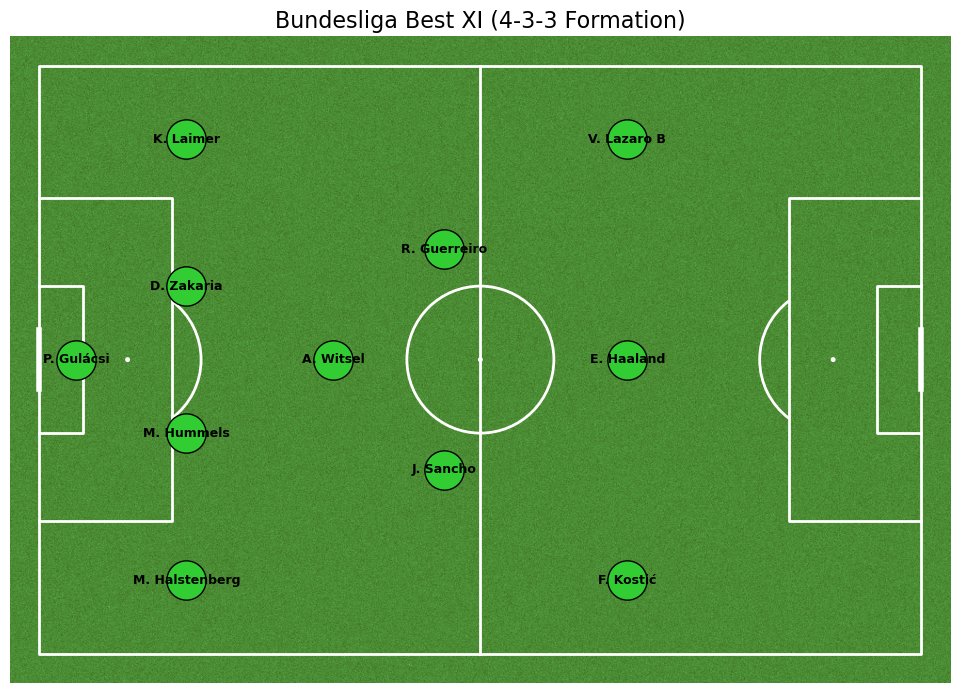

In [104]:
from mplsoccer import Pitch
import matplotlib.pyplot as plt

formation_coords_dict = {
    '4-3-3': {
        'GK': (5, 40),
        'RB': (20, 10),
        'CB1': (20, 30),
        'CB2': (20, 50),
        'LB': (20, 70),
        'CDM': (40, 40),
        'CM': (55, 25),
        'CAM': (55, 55),
        'RW': (80, 10),
        'ST': (80, 40),
        'LW': (80, 70)
    },
    '4-4-2': {
        'GK': (5, 40),
        'RB': (20, 10),
        'CB1': (20, 25),
        'CB2': (20, 55),
        'LB': (20, 70),
        'RM': (55, 10),
        'CM1': (45, 30),
        'CM2': (45, 50),
        'LM': (55, 70),
        'ST1': (80, 30),
        'ST2': (80, 50)
    },
    '3-5-2': {
        'GK': (5, 40),
        'CB1': (20, 20),
        'CB2': (20, 40),
        'CB3': (20, 60),
        'RM': (55, 10),
        'LM': (55, 70),
        'CDM': (40, 40),
        'CM': (55, 30),
        'CAM': (55, 55),
        'ST1': (80, 30),
        'ST2': (80, 50)
    }
}

formation_coords = formation_coords_dict[best_formation]
player_names = {pos: best_squad[pos]['Name'] for pos in formation_coords}

pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(10, 7))

for pos, (x, y) in formation_coords.items():
    ax.scatter(x, y, s=800, color='limegreen', edgecolors='black', zorder=2)
    ax.text(x, y, player_names[pos], ha='center', va='center', fontsize=9, fontweight='bold', color='black', zorder=3)

plt.title(f"Bundesliga Best XI ({best_formation} Formation)", fontsize=16)
plt.show()

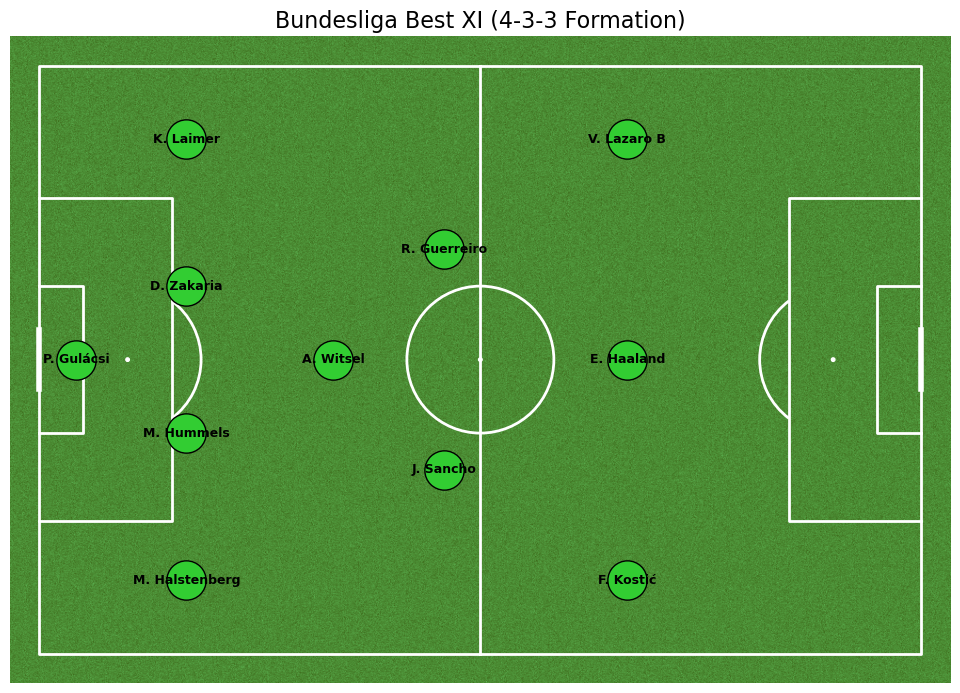

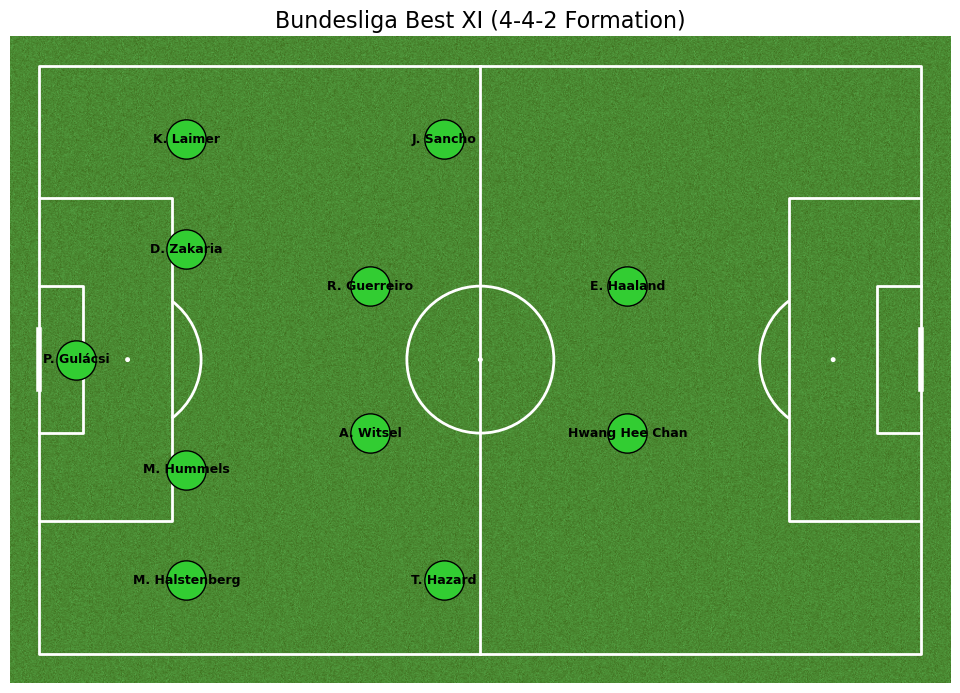

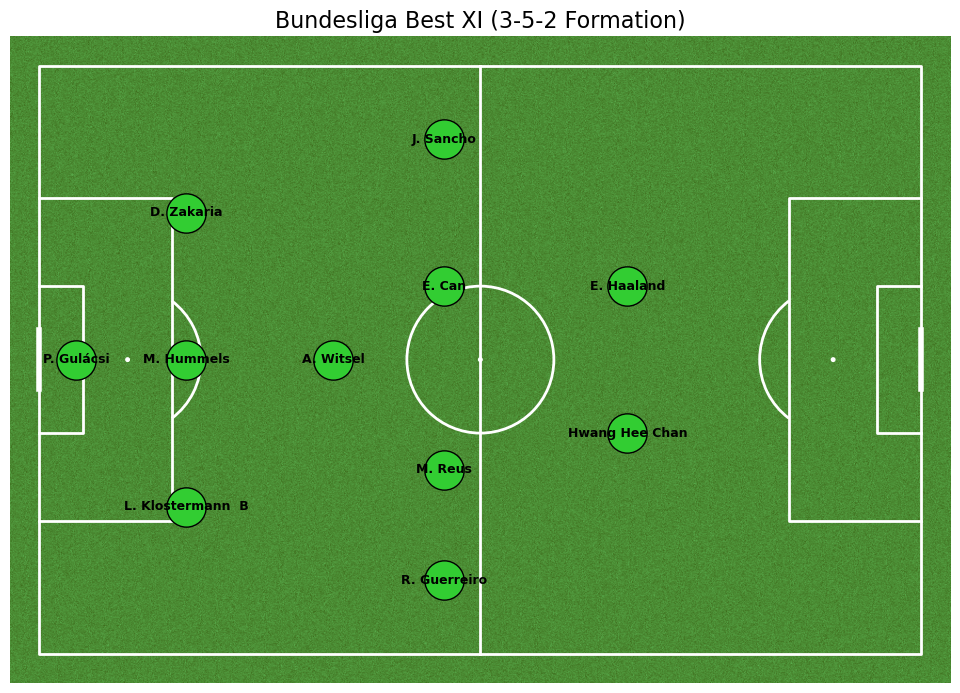

In [106]:
from mplsoccer import Pitch
import matplotlib.pyplot as plt

# Define pitch coordinates for each formation
formation_coords_dict = {
    '4-3-3': {
        'GK': (5, 40),
        'RB': (20, 10),
        'CB1': (20, 30),
        'CB2': (20, 50),
        'LB': (20, 70),
        'CDM': (40, 40),
        'CM': (55, 25),
        'CAM': (55, 55),
        'RW': (80, 10),
        'ST': (80, 40),
        'LW': (80, 70)
    },
    '4-4-2': {
        'GK': (5, 40),
        'RB': (20, 10),
        'CB1': (20, 25),
        'CB2': (20, 55),
        'LB': (20, 70),
        'RM': (55, 10),
        'CM1': (45, 30),
        'CM2': (45, 50),
        'LM': (55, 70),
        'ST1': (80, 30),
        'ST2': (80, 50)
    },
    '3-5-2': {
        'GK': (5, 40),
        'CB1': (20, 20),
        'CB2': (20, 40),
        'CB3': (20, 60),
        'RM': (55, 10),
        'LM': (55, 70),
        'CDM': (40, 40),
        'CM': (55, 30),
        'CAM': (55, 55),
        'ST1': (80, 30),
        'ST2': (80, 50)
    }
}

# Visualize each formation
for form_name, coords in formation_coords_dict.items():
    squad = all_formations_best_xi[form_name]
    player_names = {pos: squad[pos]['Name'] for pos in coords}
    pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
    fig, ax = pitch.draw(figsize=(10, 7))
    for pos, (x, y) in coords.items():
        ax.scatter(x, y, s=800, color='limegreen', edgecolors='black', zorder=2)
        ax.text(x, y, player_names[pos], ha='center', va='center', fontsize=9, fontweight='bold', color='black', zorder=3)
    plt.title(f"Bundesliga Best XI ({form_name} Formation)", fontsize=16)
    plt.show()